In [28]:
import torch
from torch.utils.data import DataLoader

from src.utils_data import load_PeMS04_flow_data, preprocess_PeMS_data, createLoaders, TimeSeriesDataset
from src.utils_graph import compute_laplacian_with_self_loop
from src.models import TGCN, GRUModel, LSTMModel, train_model

import pandas as pd

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

## Preprocessing data

In [29]:
df_PeMS, df_distance  = load_PeMS04_flow_data()
n_neighbors = 9
normalization = "center_and_reduce"
df_PeMS, adjacency_matrix_PeMS, meanstd_dict = preprocess_PeMS_data(df_PeMS, df_distance, init_node=0, n_neighbors=n_neighbors, center_and_reduce=True)

c:\Users\gcogoni\Documents\Stage\Federated-Traffic-Flow-Forecasting\src\utils_graph.py:98: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  return nx.adjacency_matrix(graph, nodelist=nodes_order, weight=None).toarray()


In [30]:
print(df_PeMS.columns)

Int64Index([62, 242, 243, 117, 28, 170, 0, 173, 92, 57], dtype='int64')


In [31]:
# Define the sliding window size and stride
_window_size = 7
_stride = 1

## TGCN

In [32]:
train_loader_TGCN, val_loader_TGCN, test_loader_TGCN = createLoaders(df_PeMS, window_size=_window_size, stride=_stride)
model_TGCN = TGCN(adjacency_matrix_PeMS, hidden_dim=32, output_size=len(df_PeMS.columns))

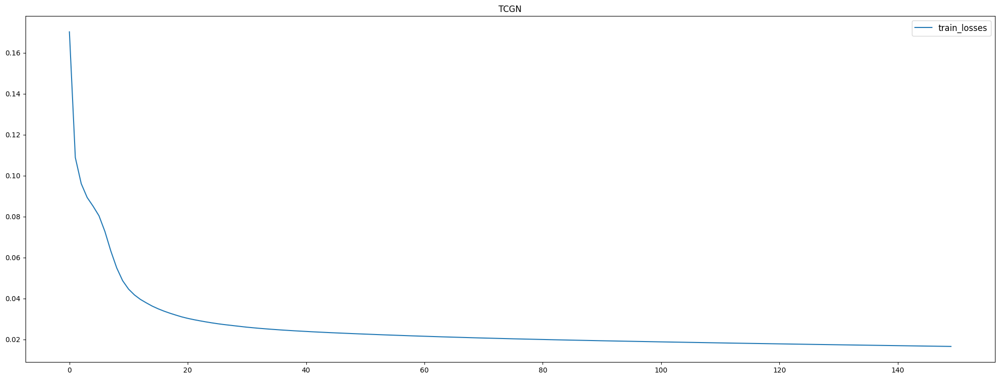

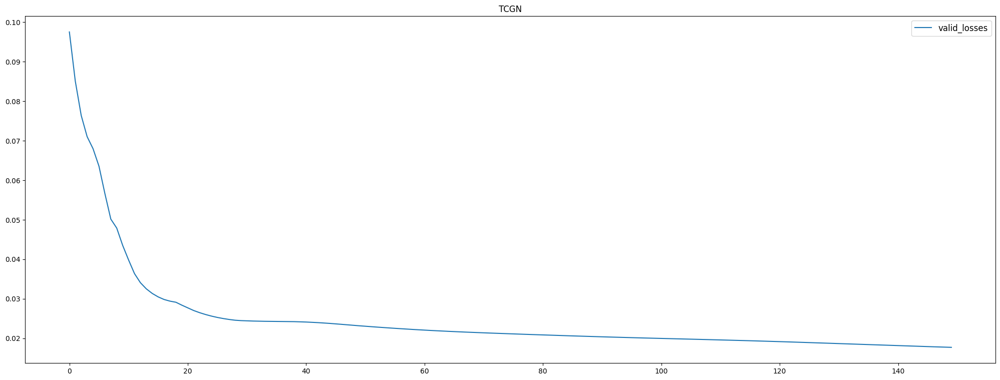

In [33]:
import matplotlib.pyplot as plt

num_epochs_TGCN = 150
model_path = f"./{normalization}/nb_captor_{n_neighbors+1}/epoch_{num_epochs_TGCN}/TGCN_model.pkl"
_ , valid_losses, train_losses = train_model(model_TGCN, train_loader_TGCN, val_loader_TGCN, model_path=model_path, num_epochs=num_epochs_TGCN, remove=False)
plt.figure(figsize=(25, 9))
plt.title("TCGN")
plt.plot(train_losses, label="train_losses")
plt.legend(fontsize=12)
plt.show()
plt.figure(figsize=(25, 9))
plt.title("TCGN")
plt.plot(valid_losses, label="valid_losses")
plt.legend(fontsize=12)
plt.show()

## Univariate 

### LSTM

In [34]:
models_univaritate_LSTM = {}

for i in range(n_neighbors+1):
    #print(f"LSTMModel {i}")
    train_loader, val_loader, test_loader = createLoaders(pd.DataFrame(df_PeMS.iloc[:, i]), window_size=_window_size, stride=_stride)
    models_univaritate_LSTM[f"LSTMModel {i}"] = {
                                                "model": LSTMModel(1, 32, 1),
                                                "train_loader": train_loader,
                                                "val_loader": val_loader,
                                                "test_loader": test_loader
    }

c:\Users\gcogoni\Documents\Stage\Federated-Traffic-Flow-Forecasting\env\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([32])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\gcogoni\Documents\Stage\Federated-Traffic-Flow-Forecasting\env\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([15])) that is different to the input size (torch.Size([15, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\gcogoni\Documents\Stage\Federated-Traffic-Flow-Forecasting\env\lib\site-packages\torch\nn\modules\loss.py:536: UserWarning: Using a target size (torch.Size([14])) that is different to the input size (t

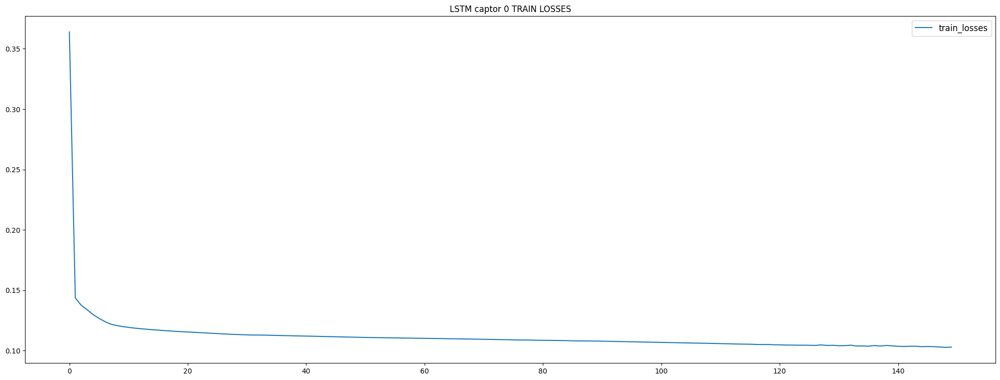

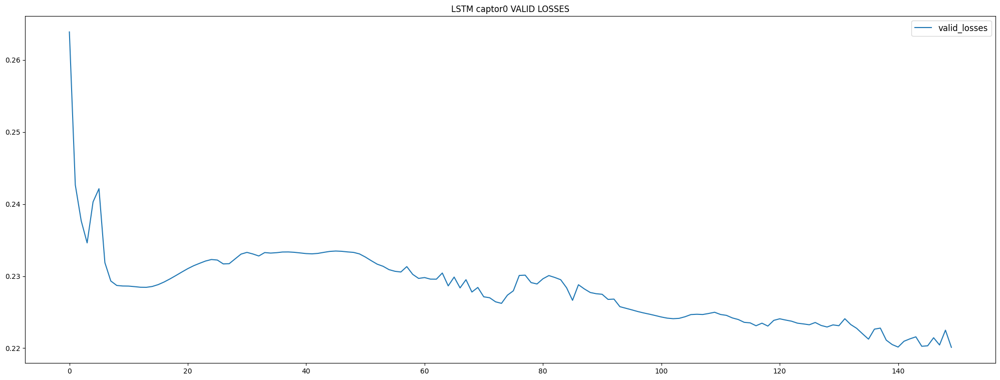

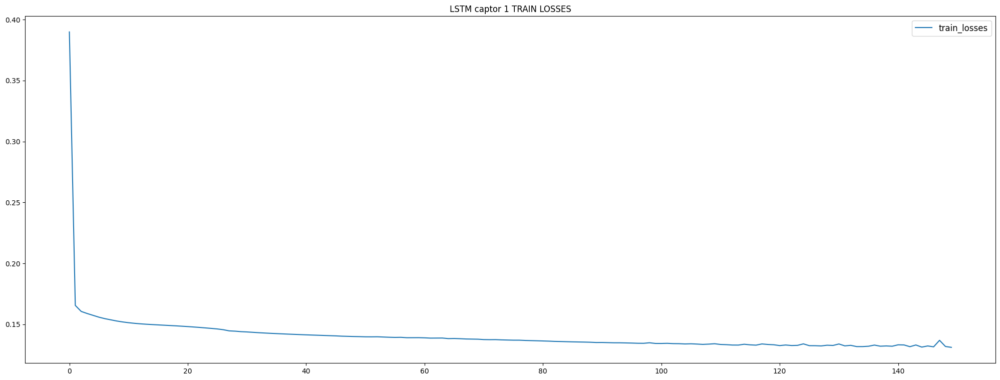

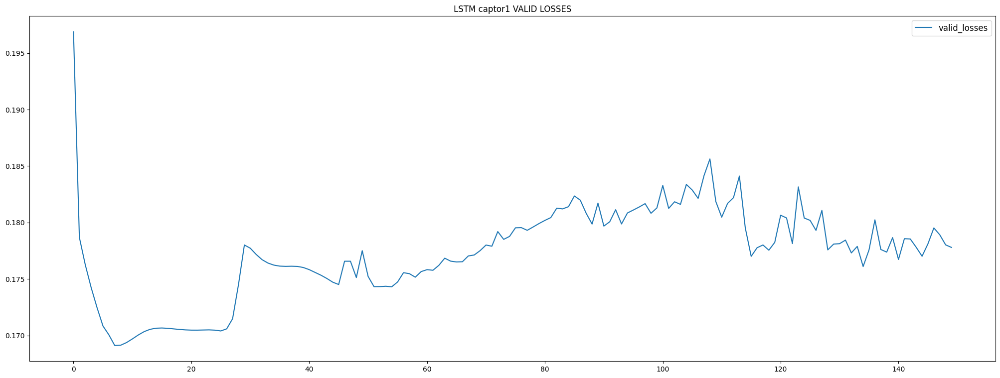

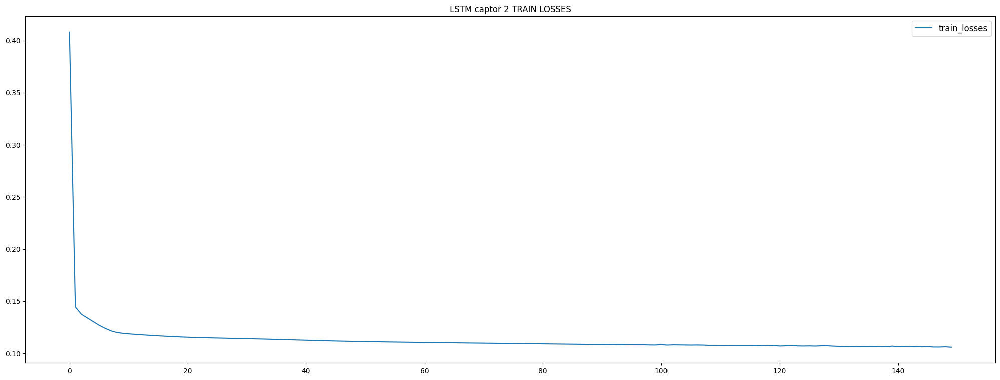

...

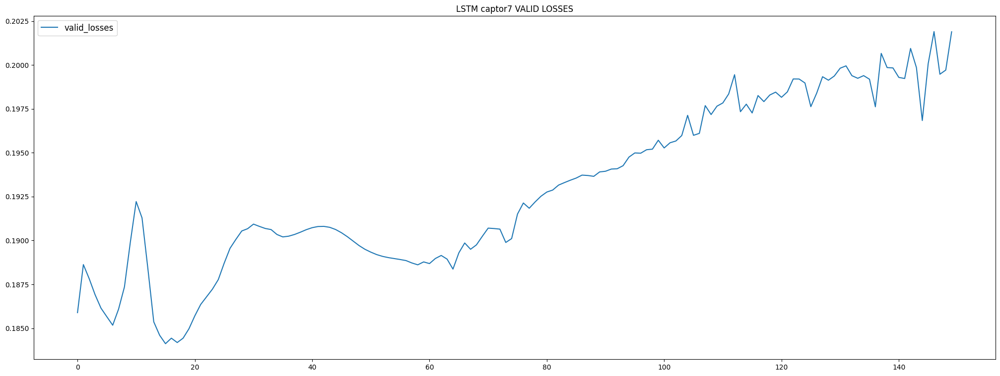

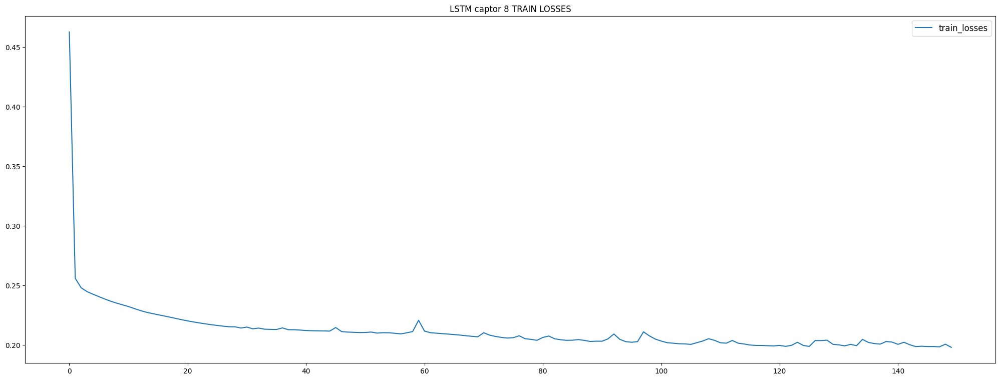

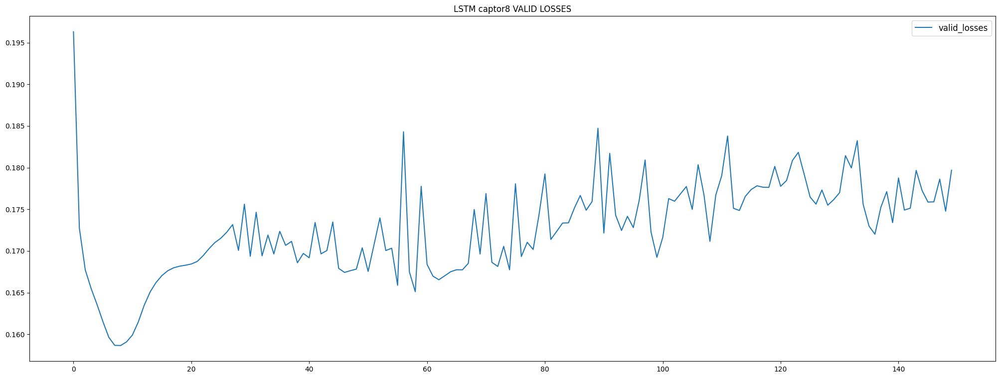

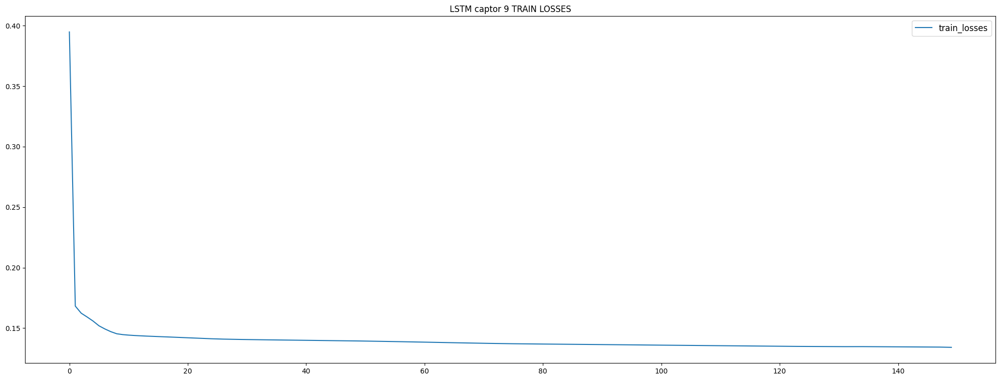

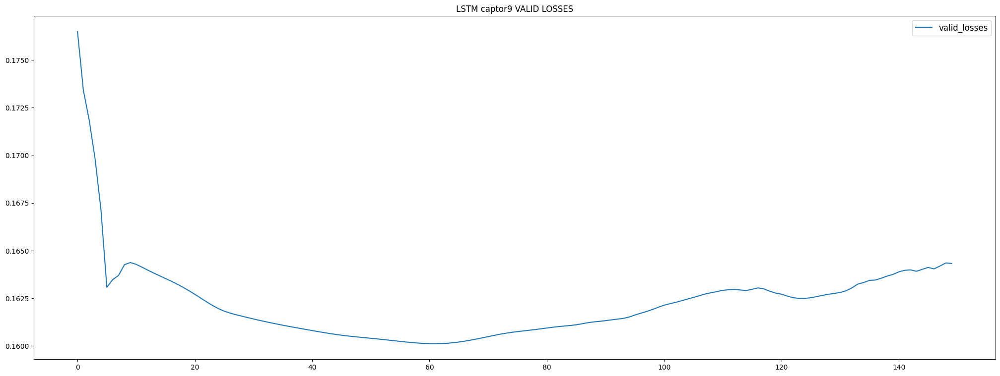

In [35]:
num_epochs_LSTM_univariate = 150

for i in range(n_neighbors+1):
    _, valid_losses, train_losses = train_model(models_univaritate_LSTM[f"LSTMModel {i}"]["model"], 
                models_univaritate_LSTM[f"LSTMModel {i}"]["train_loader"], 
                models_univaritate_LSTM[f"LSTMModel {i}"]["val_loader"], 
                f"./{normalization}/nb_captor_{n_neighbors+1}/epoch_{num_epochs_LSTM_univariate}/univariate_LSTM_model_{i}.pkl", num_epochs=num_epochs_LSTM_univariate, remove=False)
    plt.figure(figsize=(25, 9))
    plt.title(f"LSTM captor {i} TRAIN LOSSES")
    plt.plot(train_losses, label="train_losses")
    plt.legend(fontsize=12)
    plt.show()
    plt.figure(figsize=(25, 9))
    plt.title(f"LSTM captor{i} VALID LOSSES")
    plt.plot(valid_losses, label="valid_losses")
    plt.legend(fontsize=12)
    plt.show()

### GRU

In [36]:
models_univaritate_GRU = {}

for i in range(n_neighbors+1):
    #print(f"GRUModel {i}")
    train_loader, val_loader, test_loader = createLoaders(pd.DataFrame(df_PeMS.iloc[:, i]), window_size=_window_size, stride=_stride)
    models_univaritate_GRU[f"GRUModel {i}"] = { 
                                                "model": GRUModel(1, 32, 1),
                                                "train_loader": train_loader,
                                                "val_loader": val_loader,
                                                "test_loader": test_loader
    }

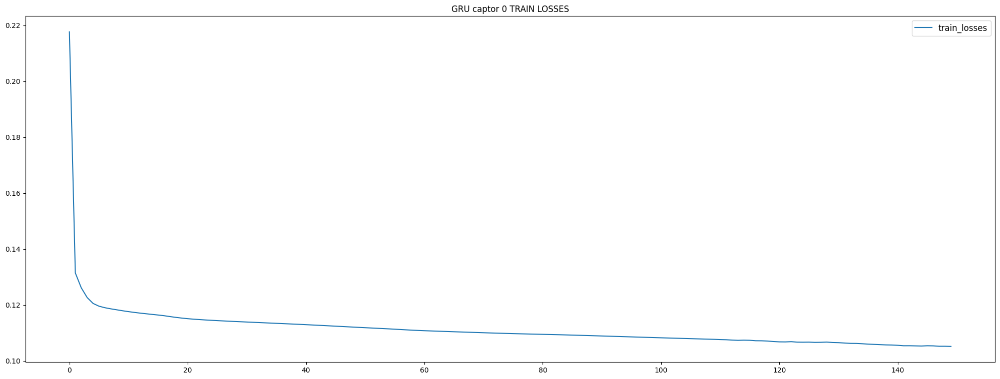

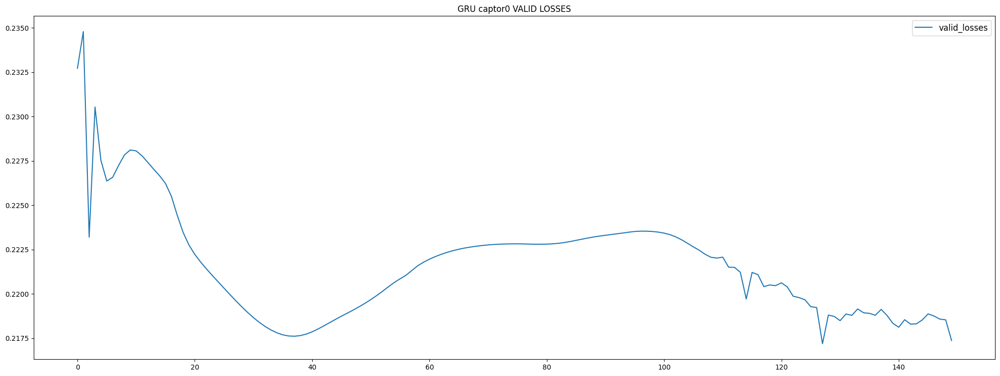

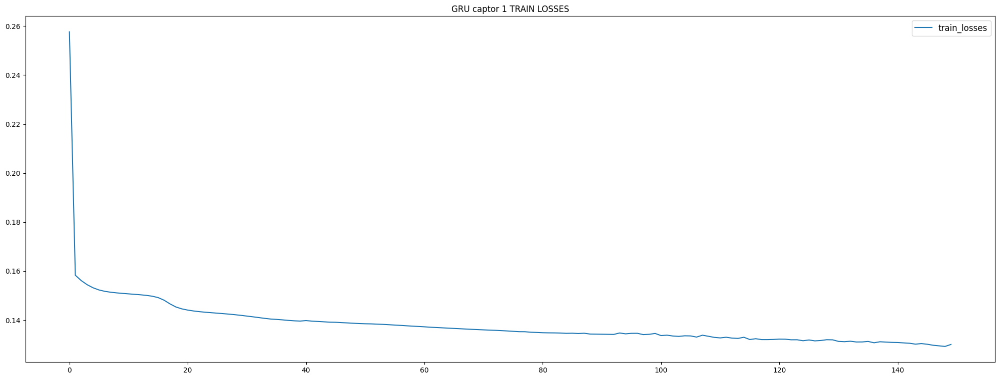

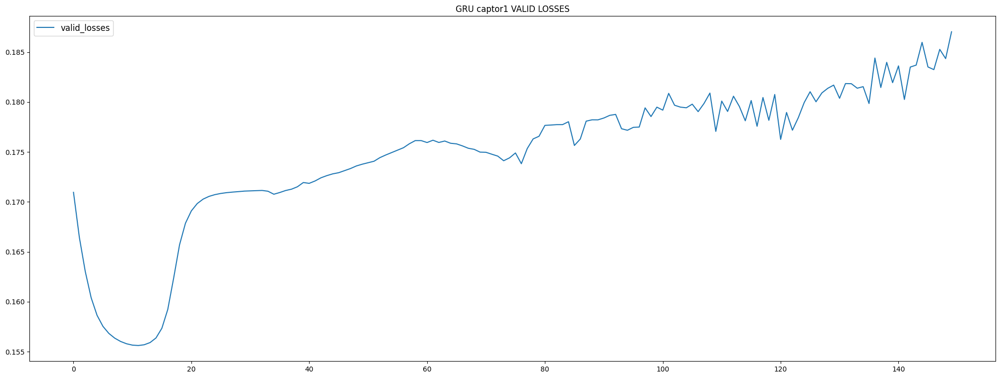

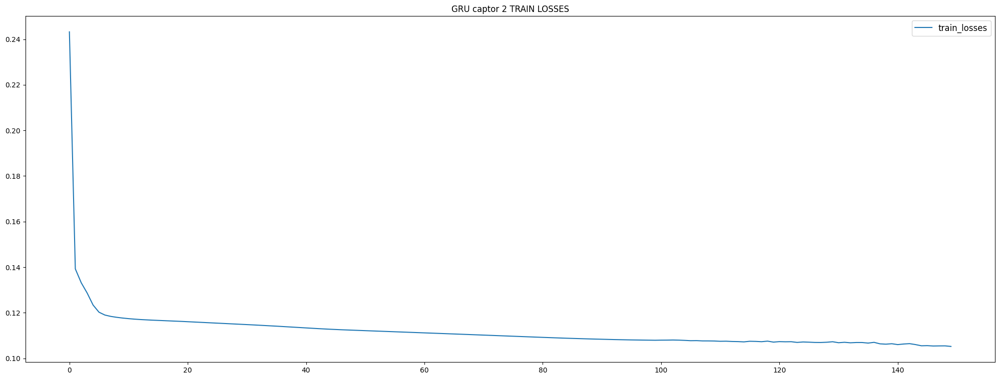

...

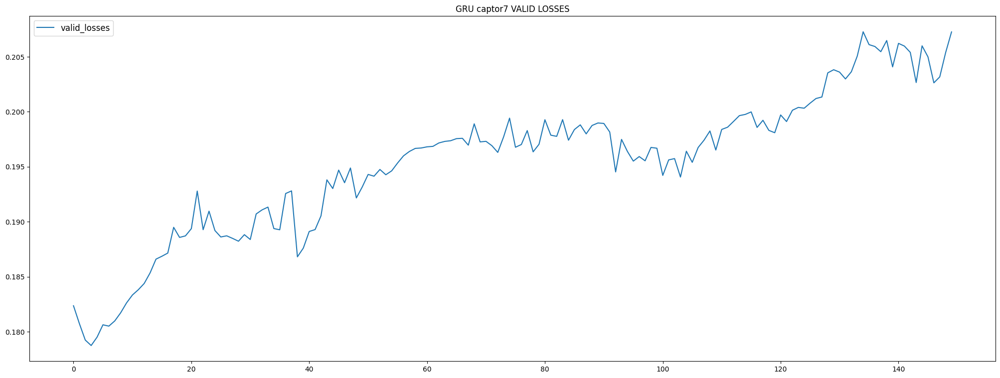

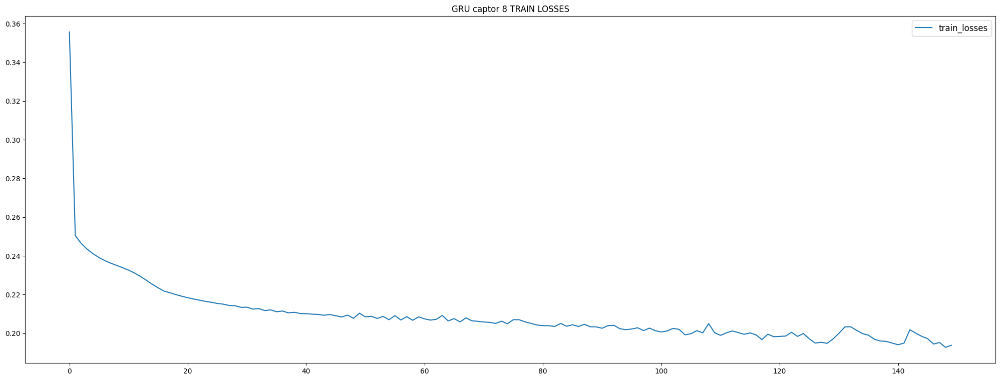

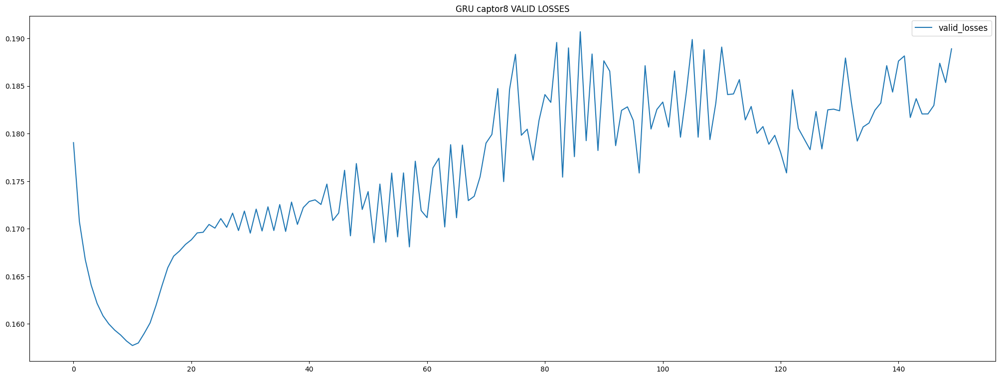

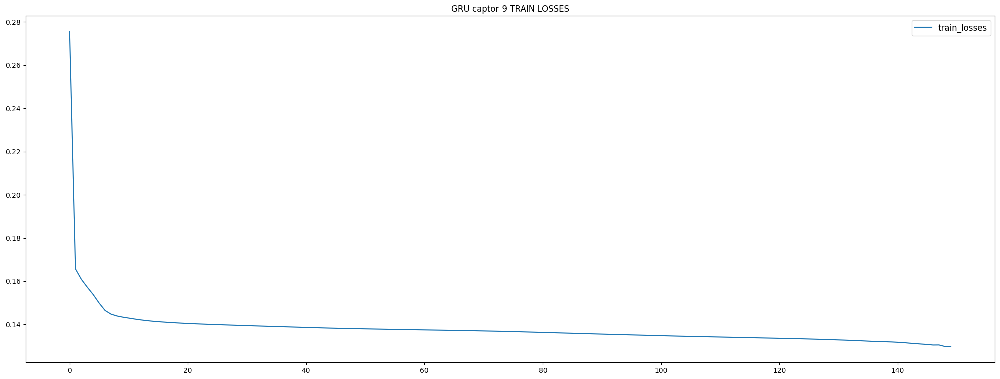

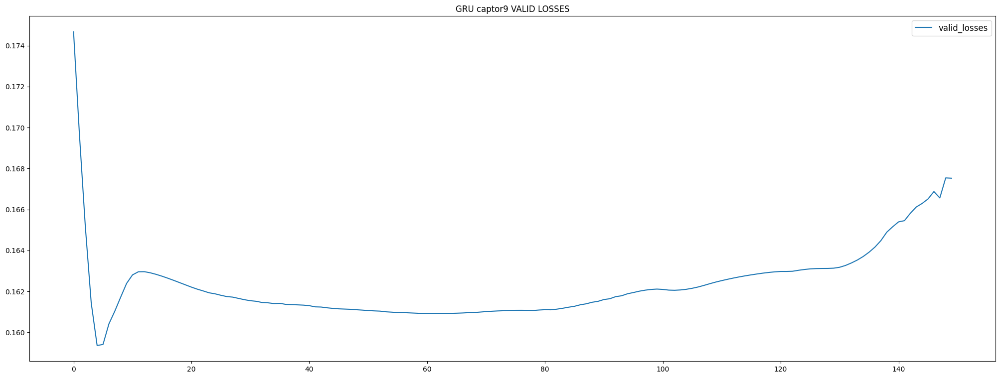

In [37]:
num_epochs_univaritate_GRU = 150

for i in range(n_neighbors+1):
    _, valid_losses, train_losses = train_model(models_univaritate_GRU[f"GRUModel {i}"]["model"], 
                models_univaritate_GRU[f"GRUModel {i}"]["train_loader"], 
                models_univaritate_GRU[f"GRUModel {i}"]["val_loader"], 
                f"./{normalization}/nb_captor_{n_neighbors+1}/epoch_{num_epochs_univaritate_GRU}/univariate_GRU_model_{i}.pkl", num_epochs=num_epochs_univaritate_GRU, remove=False)
    plt.figure(figsize=(25, 9))
    plt.title(f"GRU captor {i} TRAIN LOSSES")
    plt.plot(train_losses, label="train_losses")
    plt.legend(fontsize=12)
    plt.show()
    plt.figure(figsize=(25, 9))
    plt.title(f"GRU captor{i} VALID LOSSES")
    plt.plot(valid_losses, label="valid_losses")
    plt.legend(fontsize=12)
    plt.show()

## Functions for results 

In [38]:
def result_prediction(predictions, actuals):
    from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
    import numpy as np
    
    indices_by_month = []
    EPSILON = 1e-5
    # Créer une liste vide pour stocker les données du tableau
    data = []
    y_pred = predictions[:]
    y_true = actuals[:]

    signe = "-" if np.mean(y_pred - y_true) < 0 else "+"
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mape = mean_absolute_percentage_error(y_true, y_pred)*100
    if (mape > 1 or mape < 0):
        mape = "ERROR"
    smape = np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))*100
    maape =  np.mean(np.arctan(np.abs((y_true - y_pred) / (y_true + EPSILON))))*100
    
    return [signe, mae, rmse, mape, smape, maape]

In [39]:
def highlight_col(col, min_val):
    if col.name == "SMAPE":
        color = ['green' if val <= min_val else 'red' for val in col]
        return [f'background-color: {c}' for c in color]
    else :
        return ['' for _ in range(len(col))]


In [51]:
def highlight_rows(row, min_val, max_val):
    if row["MAAPE"] == min_val:
        color = "green"
    elif row["MAAPE"] == max_val:
        color = "red"
    else:
        color = ""
    
    return [f'background-color: {color}'] * len(row)

In [41]:
######################################################################
# Divide by max
######################################################################
def test_model(best_model, test_loader):
    import numpy as np
    
    # Load the best model and evaluate on the test set
    best_model.double()
    best_model.eval()
    criterion = torch.nn.MSELoss()
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    best_model.to(device)

    # Evaluate the model on the test set
    test_loss = 0.0
    predictions = []
    actuals = []
    with torch.no_grad():
        for inputs, targets in test_loader:
            inputs = (inputs).to(device)
            targets = (targets).squeeze().to(device)
            outputs = best_model(inputs).squeeze()
            loss = criterion(outputs, targets)
            test_loss += loss.item()
            # Save the predictions and actual values for plotting later
            predictions.append(outputs.cpu().numpy())
            actuals.append(targets.cpu().numpy())
    test_loss /= len(test_loader)
    # print(f"Test Loss: {test_loss:.4f}")
    
    # Concatenate the predictions and actuals
    predictions = np.concatenate(predictions, axis=0)
    actuals = np.concatenate(actuals, axis=0)
    return (predictions, actuals)

## Results Multivariate vs Univariate (TGCN VS LSTM - GRU)

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 62,+,4.882411,7.129293,ERROR,4.167699,4.207667
LSTM Model captor 62,+,9.015936,13.706814,ERROR,11.315522,11.490172
GRU Model captor 62,-,8.154902,12.215251,ERROR,9.649100,9.729884


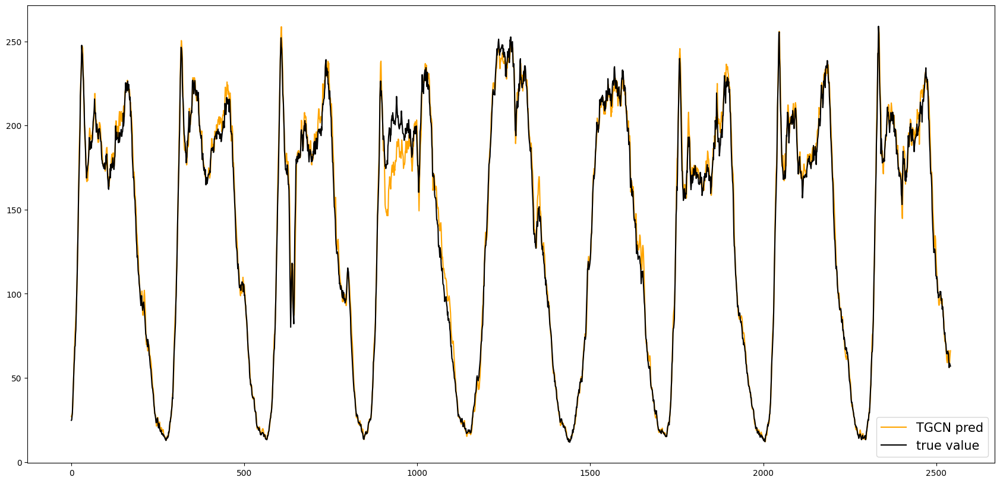

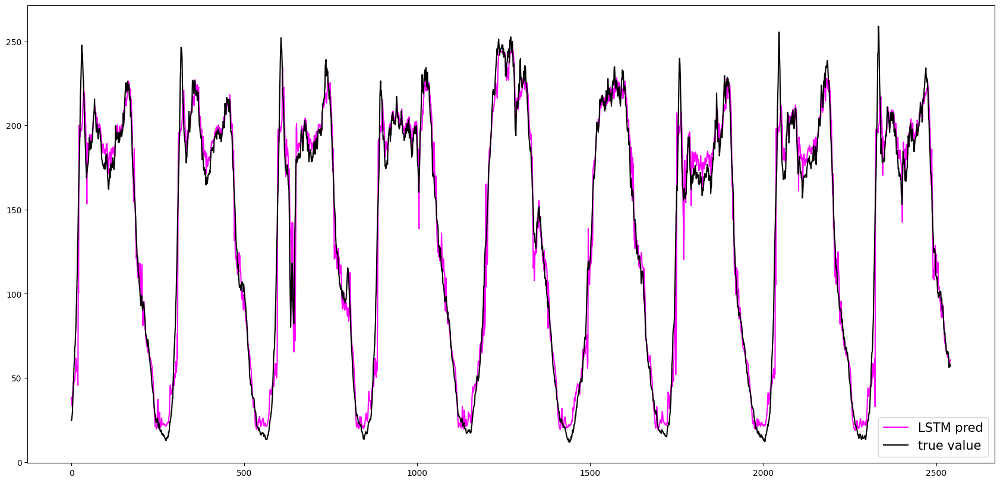

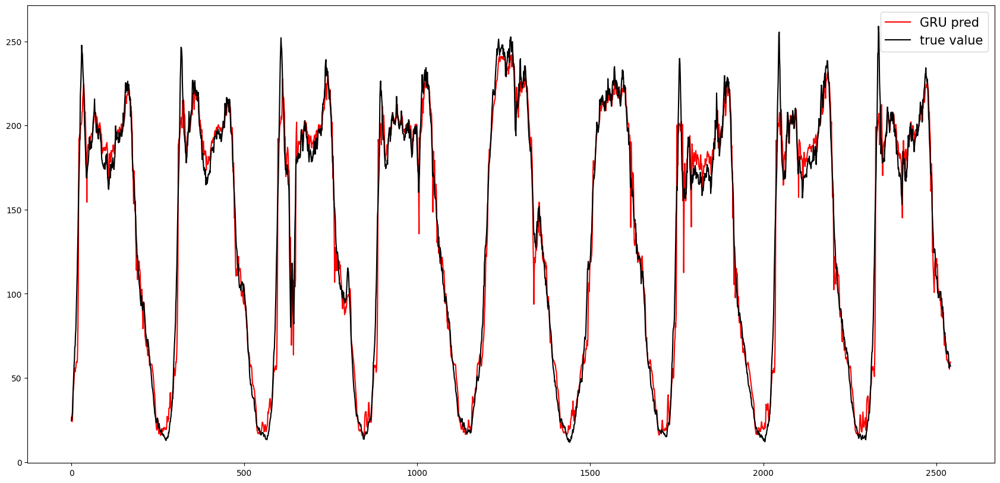

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 242,-,9.779502,13.288198,ERROR,31.468222,25.723304
LSTM Model captor 242,-,14.444385,19.268895,ERROR,41.408512,36.119476
GRU Model captor 242,-,11.811836,15.136233,ERROR,38.787095,34.387361


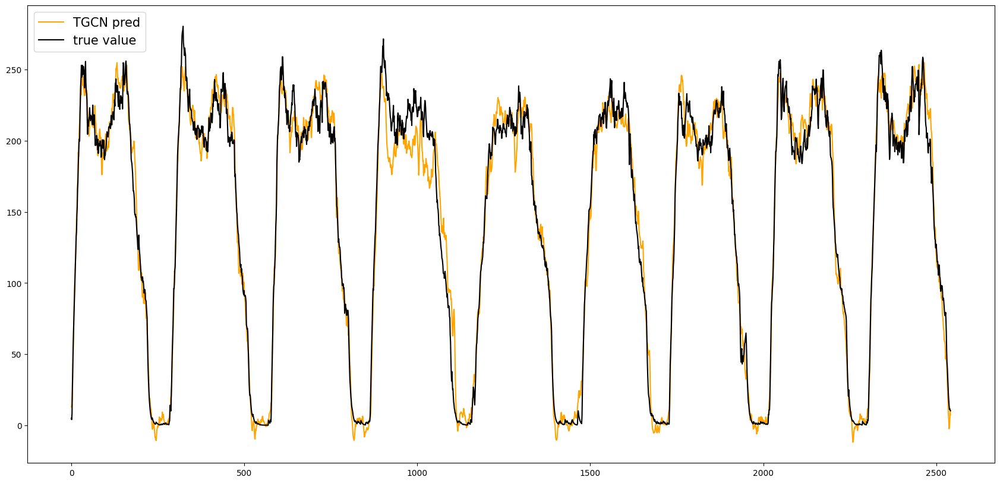

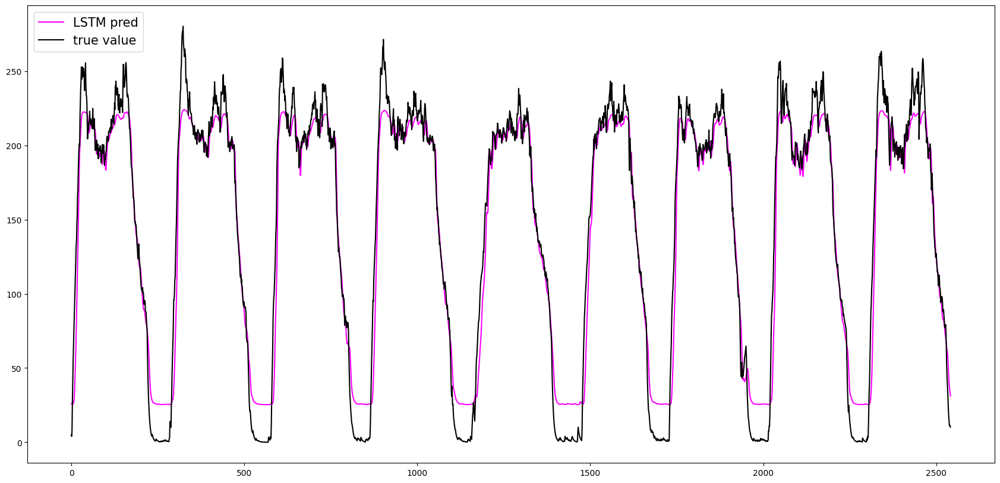

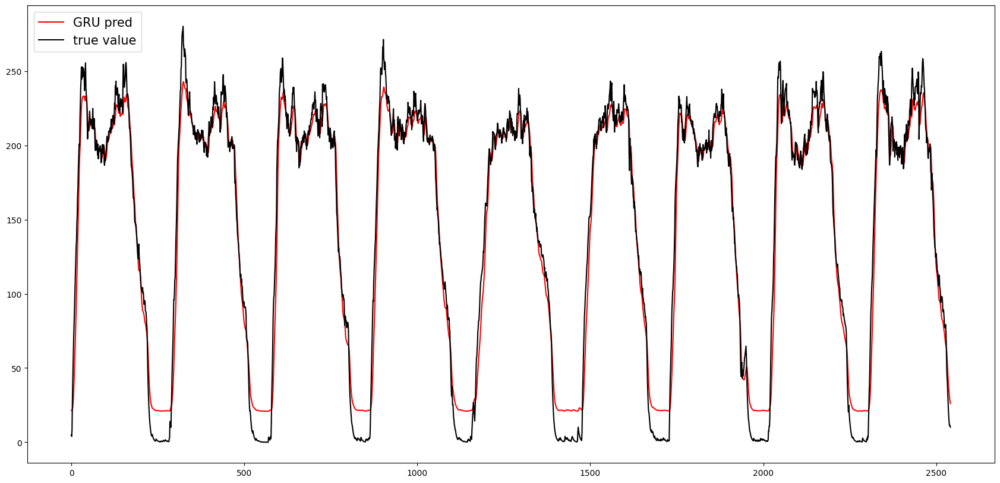

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 243,+,6.788770,9.405207,ERROR,4.553239,4.527711
LSTM Model captor 243,-,7.983383,10.701326,ERROR,9.053130,9.654210
GRU Model captor 243,-,8.586693,10.632540,ERROR,8.728515,9.255017


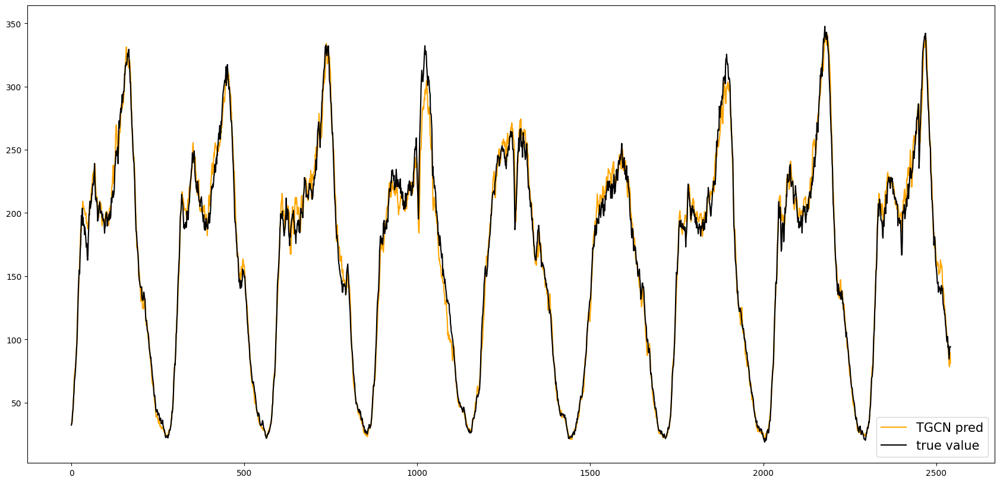

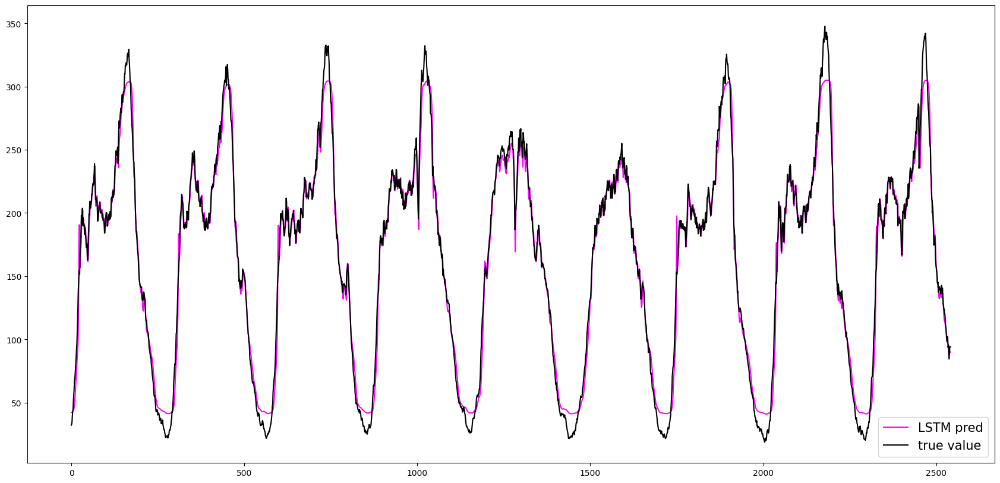

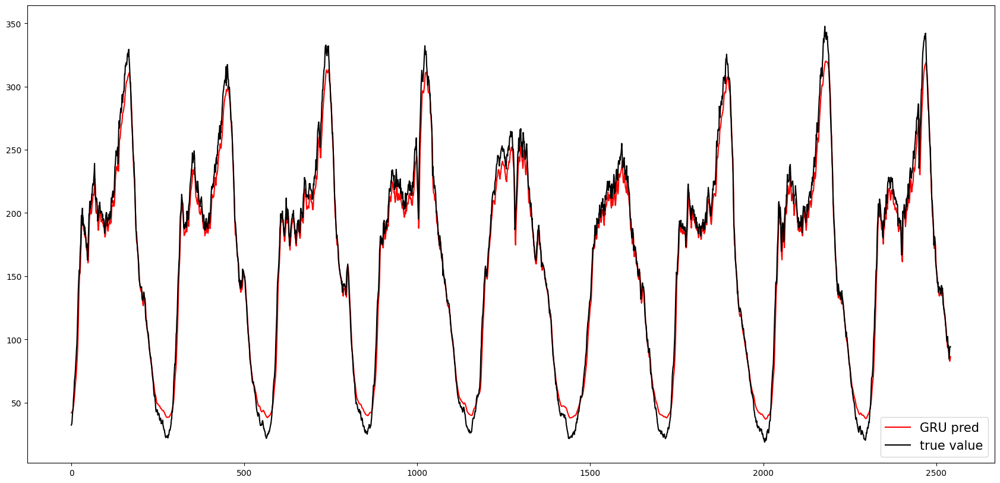

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 117,+,11.301371,15.303040,ERROR,5.851914,5.660515
LSTM Model captor 117,-,25.184448,31.552454,ERROR,15.927681,16.787203
GRU Model captor 117,-,18.593500,25.153947,ERROR,11.027963,11.595166


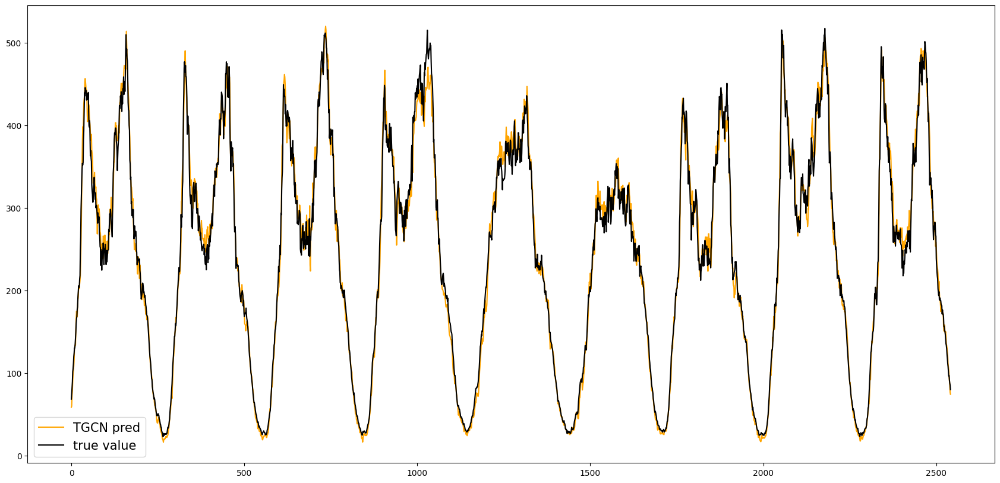

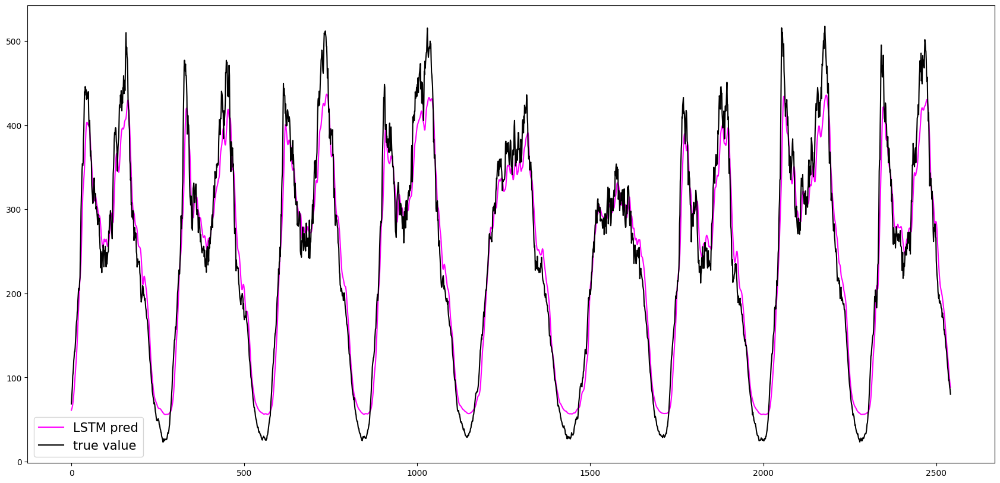

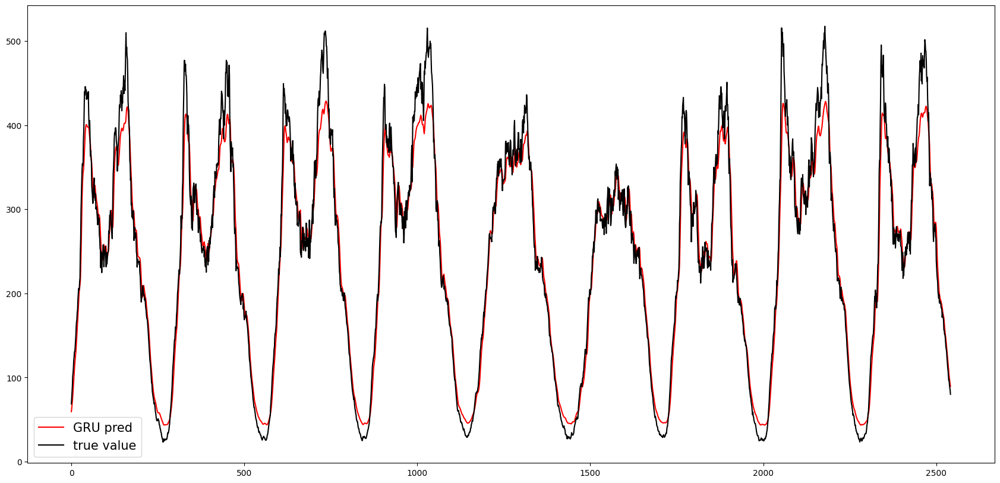

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 28,-,29.146626,54.809639,ERROR,13.368445,10.929085
LSTM Model captor 28,-,13.517923,17.541334,ERROR,6.714198,6.878462
GRU Model captor 28,-,14.738573,19.125217,ERROR,7.429918,7.601837


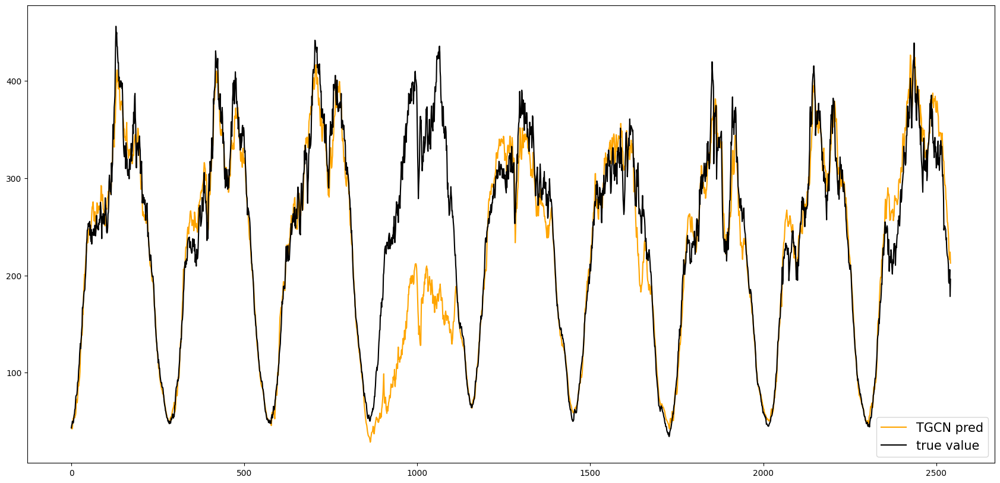

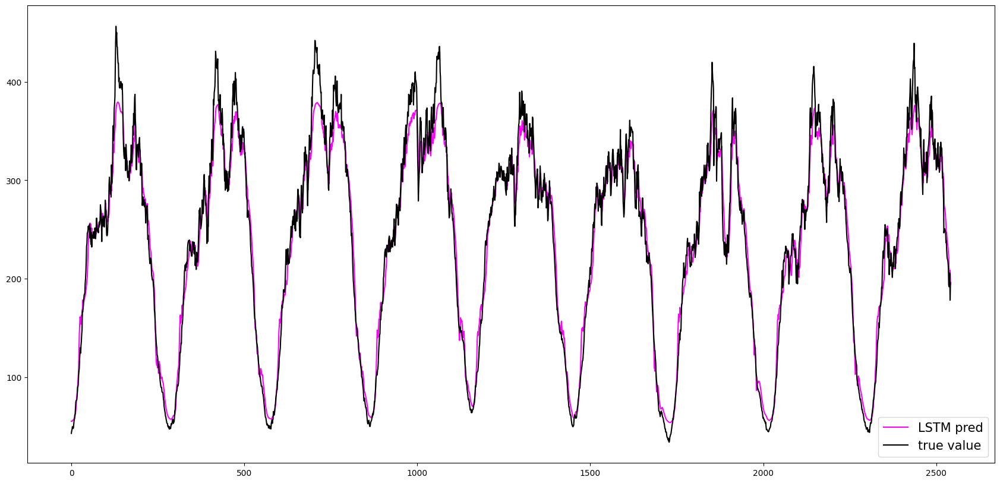

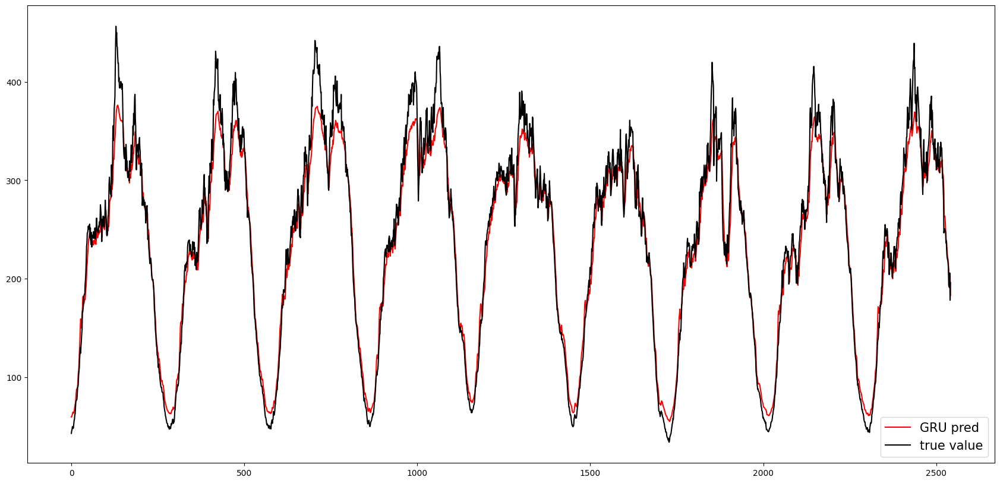

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 170,+,10.782825,14.675334,ERROR,5.720546,5.640389
LSTM Model captor 170,+,13.412468,17.461760,ERROR,11.055487,11.618881
GRU Model captor 170,+,8.013036,10.267467,ERROR,3.977775,4.026635


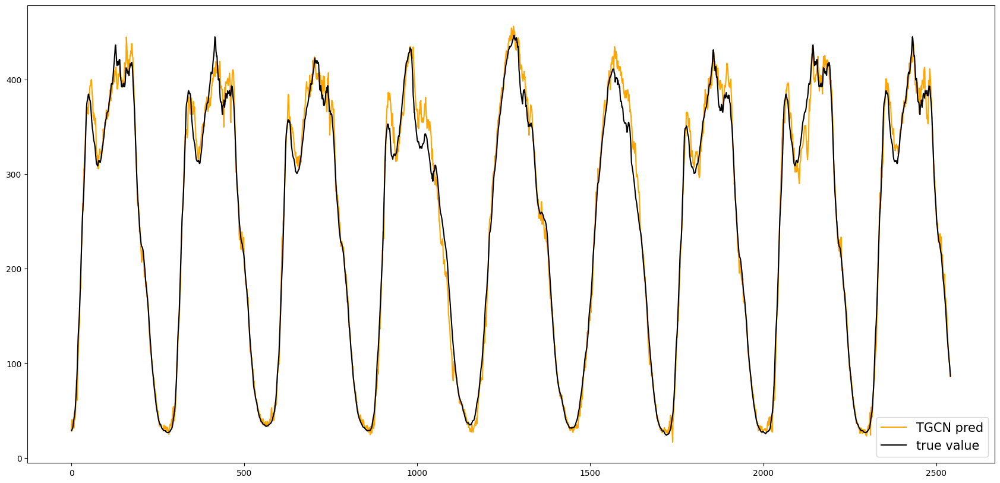

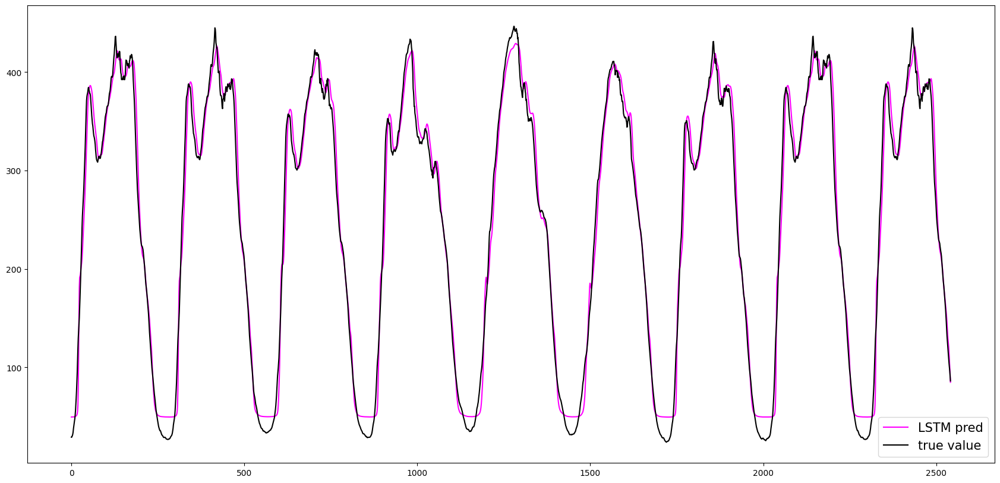

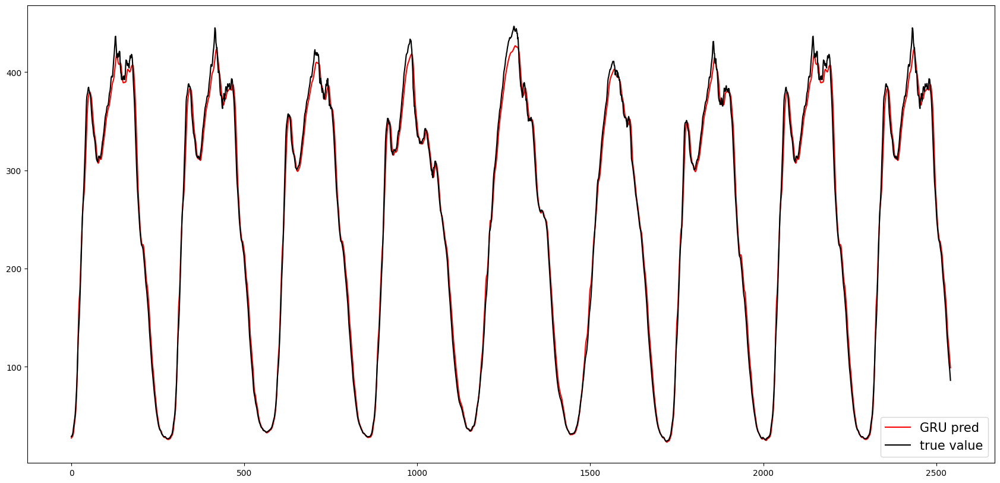

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 0,+,11.063275,15.614372,ERROR,4.328095,4.372352
LSTM Model captor 0,-,24.747292,31.195387,ERROR,16.074135,17.130163
GRU Model captor 0,-,23.178995,29.463404,ERROR,14.720039,15.906158


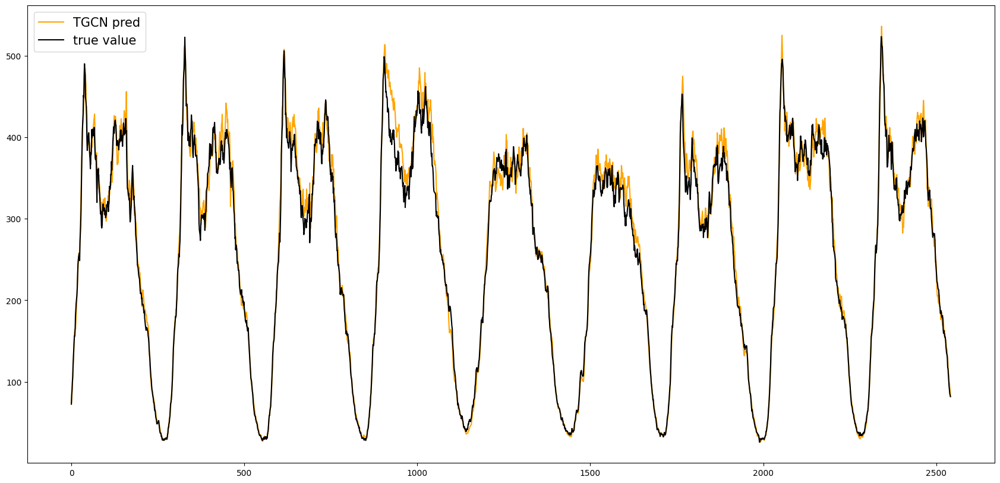

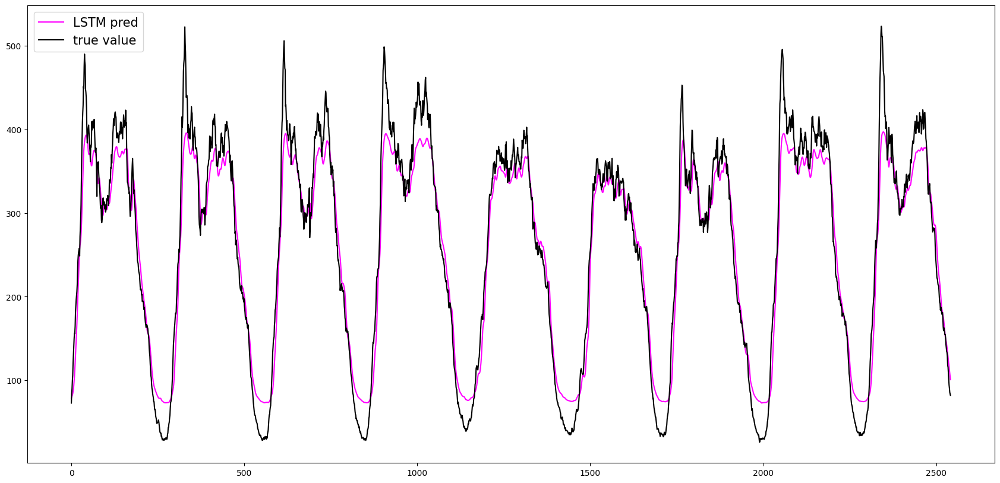

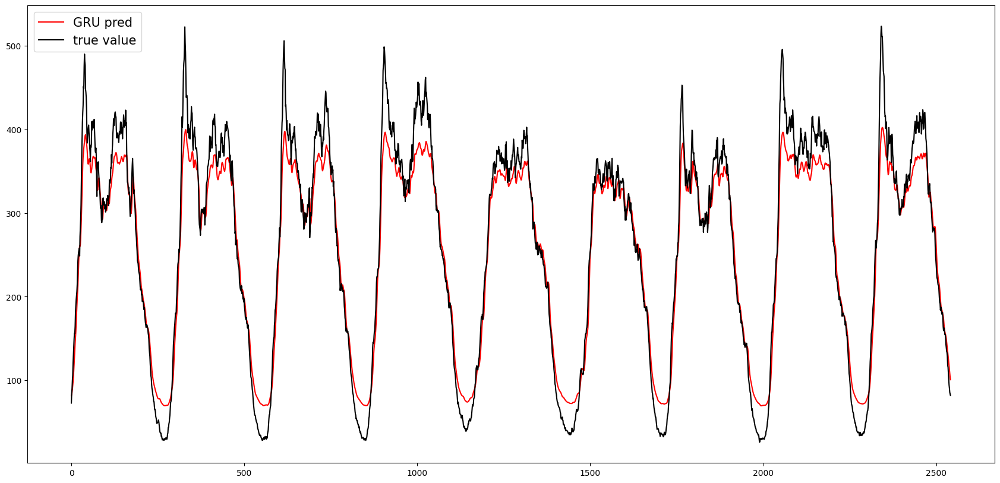

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 173,+,15.054401,20.910280,ERROR,5.142807,5.228398
LSTM Model captor 173,-,19.211871,25.499290,ERROR,6.556974,6.544431
GRU Model captor 173,-,20.168677,26.317482,ERROR,7.958850,7.900898


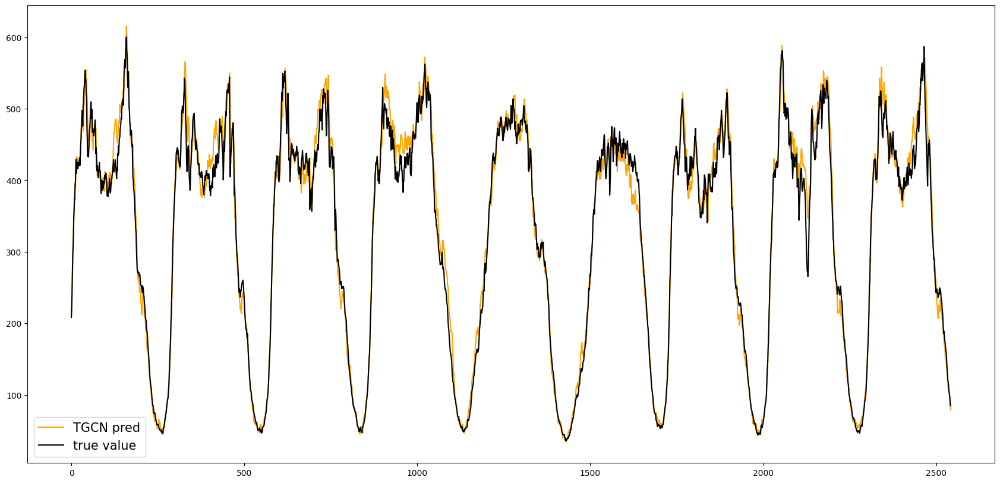

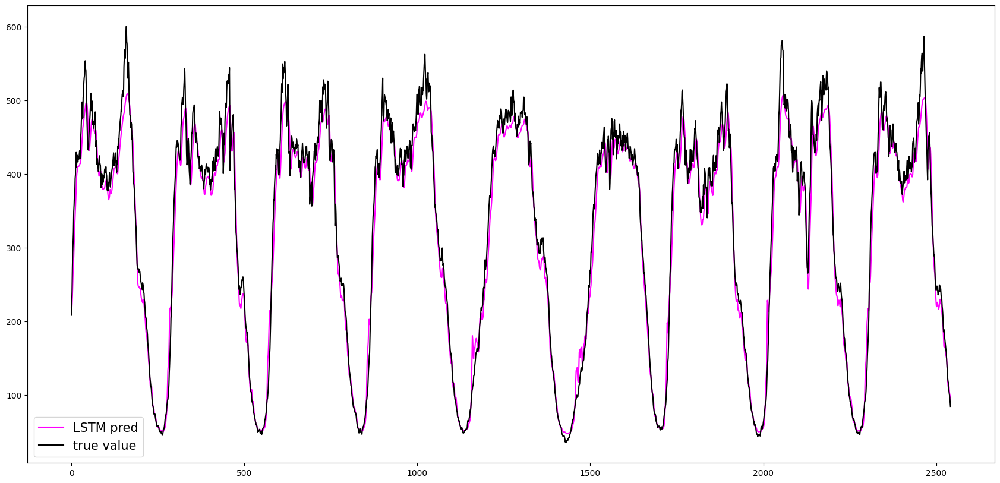

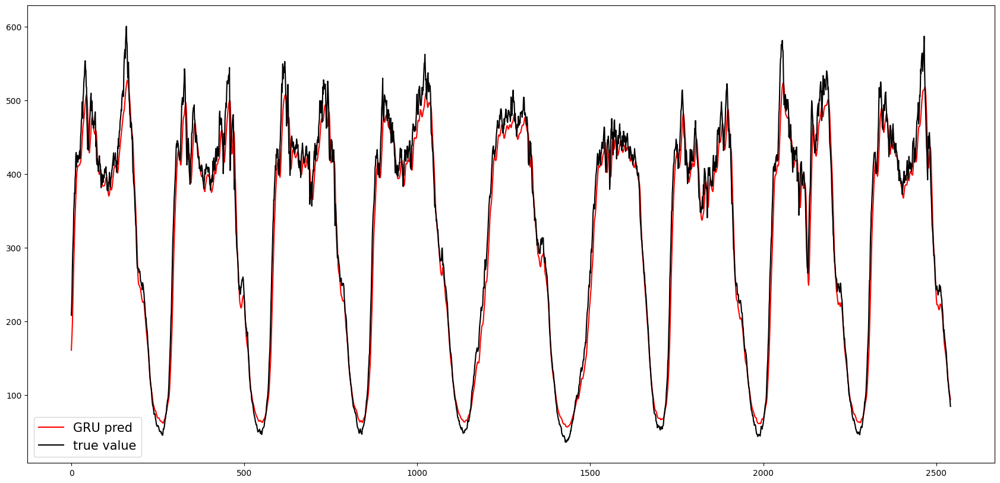

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 92,+,14.521548,19.726922,ERROR,4.740825,4.832583
LSTM Model captor 92,-,34.386018,42.911867,ERROR,16.713035,18.263647
GRU Model captor 92,+,30.933277,40.010573,ERROR,14.690662,16.069078


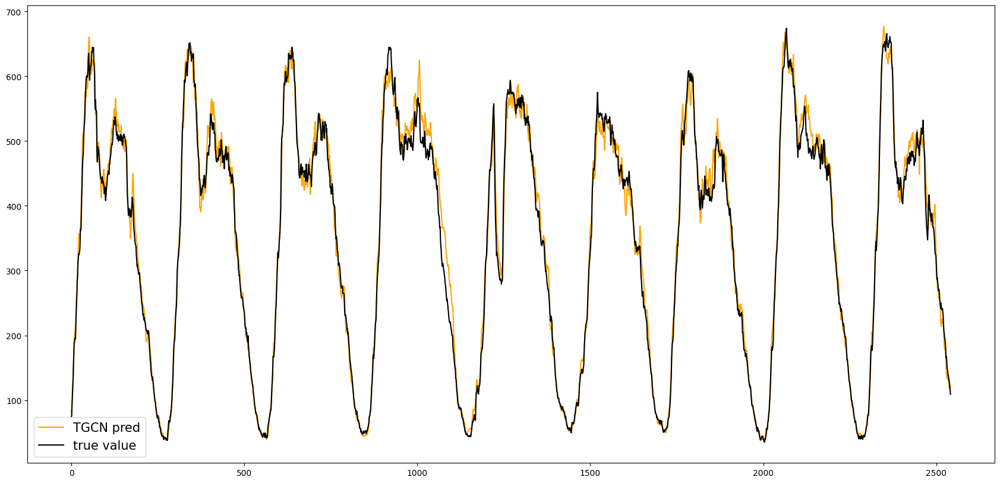

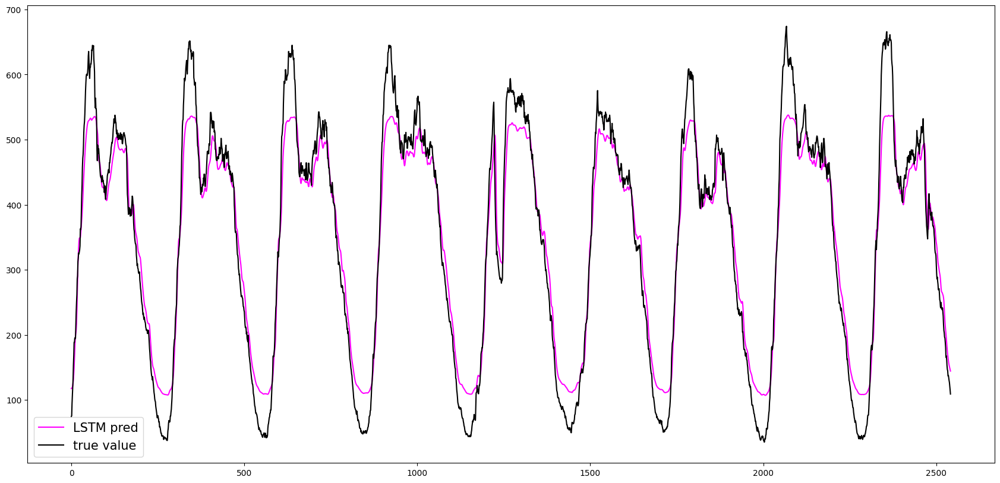

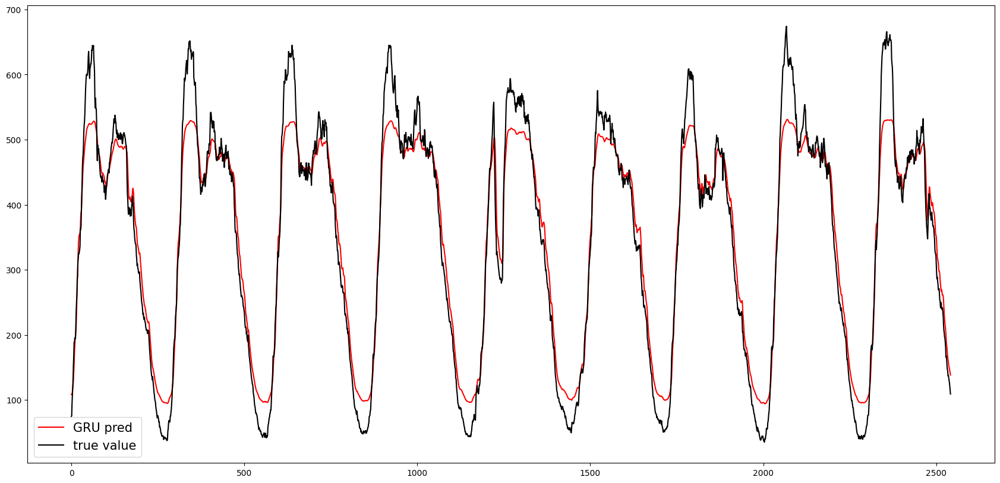

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 57,+,52.399221,103.915962,ERROR,26.612642,22.451945
LSTM Model captor 57,+,33.360197,47.118288,ERROR,27.174955,23.396359
GRU Model captor 57,+,20.998052,27.347819,ERROR,24.253391,20.210479


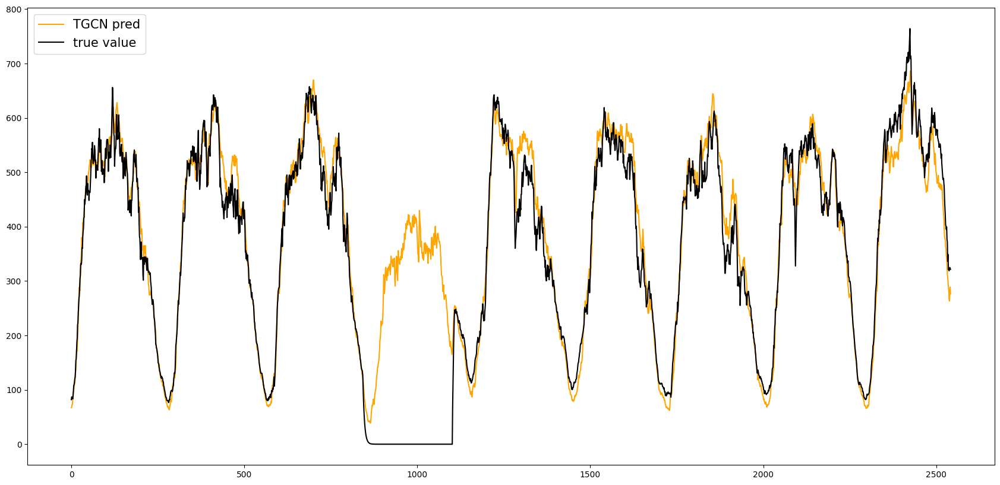

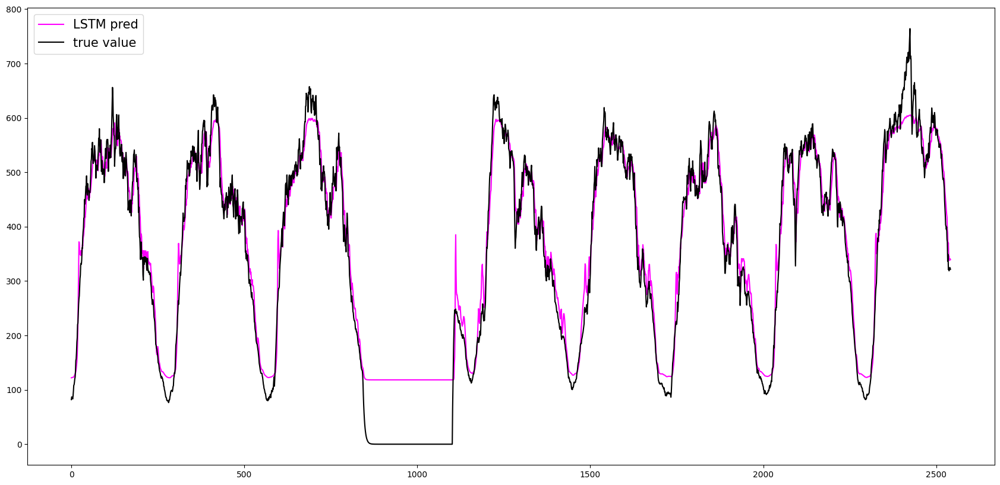

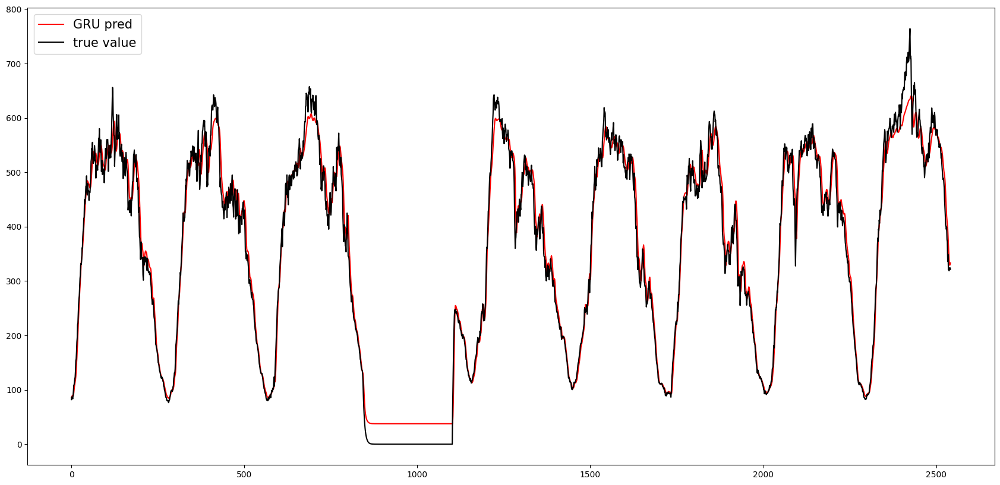

In [55]:
import matplotlib.pyplot as plt

######################################################################
# TGCN
######################################################################
# load best model
model_TGCN.load_state_dict(torch.load(f"./{normalization}/nb_captor_{n_neighbors+1}/epoch_{num_epochs_TGCN}/TGCN_model.pkl".format(input)))

# Make predictions
predictions_TGCN, actuals_TGCN = test_model(model_TGCN, test_loader_TGCN)


for i in range(n_neighbors+1):

    # Save result for each captor
    temp = result_prediction(predictions_TGCN[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], 
                            actuals_TGCN[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"])
    temp.append(f"TGCN Model captor {df_PeMS.columns[i]}")
    data = [temp]


######################################################################
# LSTM
######################################################################
    # load best model
    models_univaritate_LSTM[f"LSTMModel {i}"]["model"].load_state_dict(torch.load(f"./{normalization}/nb_captor_{n_neighbors+1}/epoch_{num_epochs_LSTM_univariate}/univariate_LSTM_model_{i}.pkl".format(input)))
    
    # Make predictions
    predictions_LSTM, actuals_LSTM = test_model(models_univaritate_LSTM[f"LSTMModel {i}"]["model"], 
                                    models_univaritate_LSTM[f"LSTMModel {i}"]["test_loader"])

    # Save result
    temp = result_prediction(predictions_LSTM * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], 
                            actuals_LSTM * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"])

    temp.append(f"LSTM Model captor {df_PeMS.columns[i]}")
    data.append(temp)


######################################################################
# GRU
######################################################################
    # Load best model
    models_univaritate_GRU[f"GRUModel {i}"]["model"].load_state_dict(torch.load(f"./{normalization}/nb_captor_{n_neighbors+1}/epoch_{num_epochs_univaritate_GRU}/univariate_GRU_model_{i}.pkl".format(input)))
    predictions_GRU, actuals_GRU = test_model(models_univaritate_GRU[f"GRUModel {i}"]["model"], 
                                    models_univaritate_GRU[f"GRUModel {i}"]["test_loader"])

    # Make predictions
    temp = result_prediction(predictions_GRU * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"]
                            , actuals_GRU * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"])

    # Save results
    temp.append(f"GRU Model captor {df_PeMS.columns[i]}")
    data.append(temp)


######################################################################
# Dataframe
######################################################################

    df = pd.DataFrame(data, columns=['Signe error', 'MAE', 'RMSE', 'MAPE', 'SMAPE', 'MAAPE', "Captor"])

    # Définir le mois comme index du DataFrame
    df.set_index('Captor', inplace=True)

    pd.set_option('display.max_columns', None)
    pd.set_option('display.max_rows', None)
    pd.set_option('display.width', None)

    min_val = df['MAAPE'].min()
    max_val = df['MAAPE'].max()
    #df = df.style.apply(highlight_col, axis=0, min_val=min_val)
    df = df.style.apply(highlight_rows, axis=1, min_val=min_val, max_val=max_val)
    display(df)


######################################################################
# Plots
######################################################################
    plt.figure(figsize=(21, 10))
    plt.plot(predictions_TGCN[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], color="orange", label="TGCN pred")
    plt.plot(actuals_LSTM * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], color="black", label="true value")
    plt.legend(fontsize=15)
    plt.show()
    
    plt.figure(figsize=(21, 10))
    plt.plot(predictions_LSTM * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], color="magenta", label="LSTM pred")
    plt.plot(actuals_LSTM * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], color="black", label="true value")
    plt.legend(fontsize=15)
    plt.show()
    
    plt.figure(figsize=(21, 10))
    plt.plot(predictions_GRU * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], color="red", label="GRU pred" )
    plt.plot(actuals_LSTM * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], color="black", label="true value")
    plt.legend(fontsize=15)
    plt.show()


## Multivariate

### LSTM

In [43]:
print("LSTMModel")
train_loader, val_loader, test_loader = createLoaders(pd.DataFrame(df_PeMS), window_size=_window_size, stride=_stride)
models_multivariate_LSTM = {
                                                "model": LSTMModel(len(df_PeMS.columns), 32, len(df_PeMS.columns)),
                                                "train_loader": train_loader,
                                                "val_loader": val_loader,
                                                "test_loader": test_loader
    }

LSTMModel


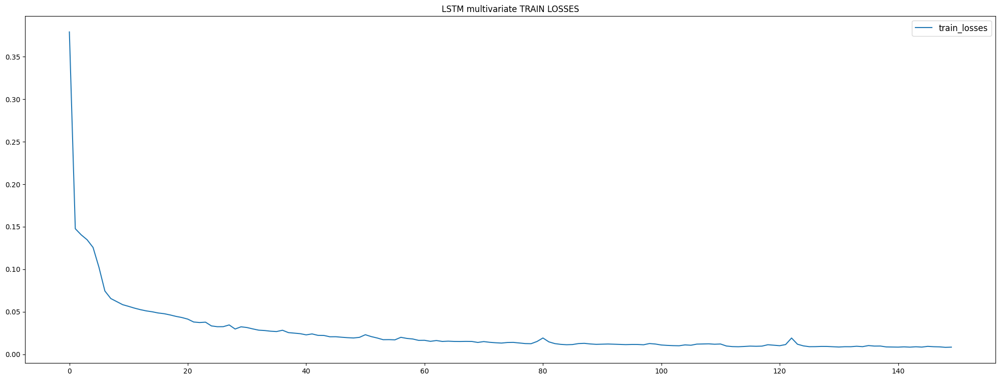

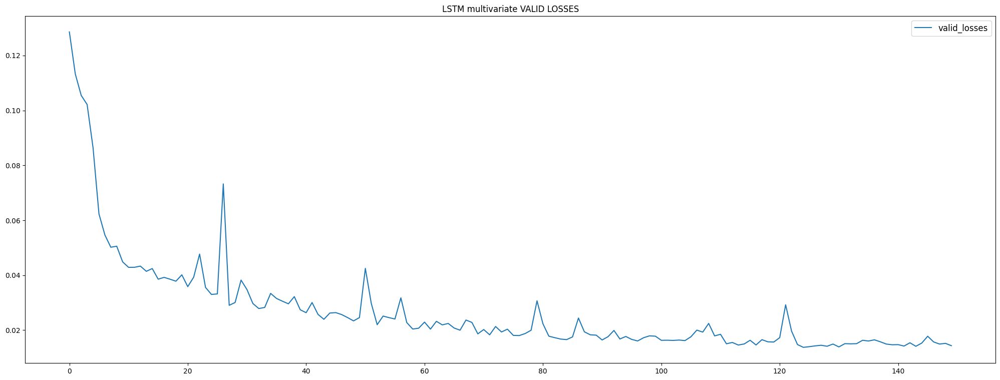

In [44]:
num_epochs_LSTM_multivariate = 150

_, valid_losses, train_losses = train_model(models_multivariate_LSTM["model"], 
            models_multivariate_LSTM["train_loader"], 
            models_multivariate_LSTM["val_loader"], 
            f"./{normalization}/nb_captor_{n_neighbors+1}/epoch_{num_epochs_LSTM_multivariate}/multivariate_LSTM_model.pkl", num_epochs=num_epochs_LSTM_multivariate, remove=False)

plt.figure(figsize=(25, 9))
plt.title(f"LSTM multivariate TRAIN LOSSES")
plt.plot(train_losses, label="train_losses")
plt.legend(fontsize=12)
plt.show()
plt.figure(figsize=(25, 9))
plt.title(f"LSTM multivariate VALID LOSSES")
plt.plot(valid_losses, label="valid_losses")
plt.legend(fontsize=12)
plt.show()

### GRU

In [45]:
print("GRUModel")
train_loader, val_loader, test_loader = createLoaders(pd.DataFrame(df_PeMS), window_size=_window_size, stride=_stride)
models_multivariate_GRU = {
                                                "model": GRUModel(len(df_PeMS.columns), 32, len(df_PeMS.columns)),
                                                "train_loader": train_loader,
                                                "val_loader": val_loader,
                                                "test_loader": test_loader
    }

GRUModel


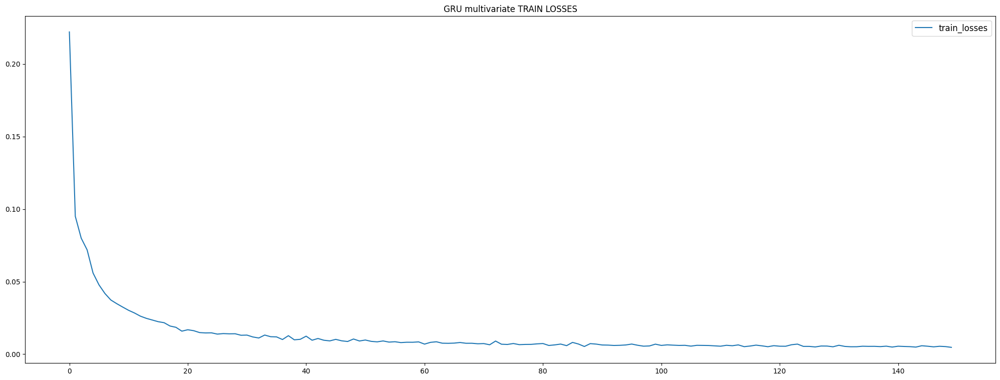

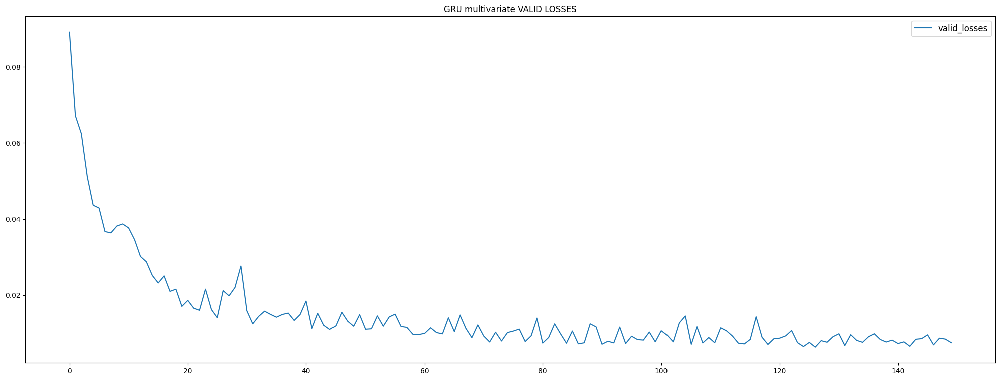

In [46]:
num_epochs_GRU_multivariate = 150

_, valid_losses, train_losses = train_model(models_multivariate_GRU["model"], 
                models_multivariate_GRU["train_loader"], 
                models_multivariate_GRU["val_loader"], 
                f"./{normalization}/nb_captor_{n_neighbors+1}/epoch_{num_epochs_GRU_multivariate}/multivariate_GRU_model.pkl", num_epochs=num_epochs_GRU_multivariate, remove=False)
plt.figure(figsize=(25, 9))
plt.title(f"GRU multivariate TRAIN LOSSES")
plt.plot(train_losses, label="train_losses")
plt.legend(fontsize=12)
plt.show()
plt.figure(figsize=(25, 9))
plt.title(f"GRU multivariate VALID LOSSES")
plt.plot(valid_losses, label="valid_losses")
plt.legend(fontsize=12)
plt.show()

## Results Multivariate vs Multivariate (TGCN VS LSTM - GRU)

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 62,+,4.882411,7.129293,ERROR,4.167699,4.207667
LSTM Model captor 62,+,6.895818,10.886864,ERROR,6.034344,6.102007
GRU Model captor 62,-,4.479383,7.281094,ERROR,4.268835,4.330292


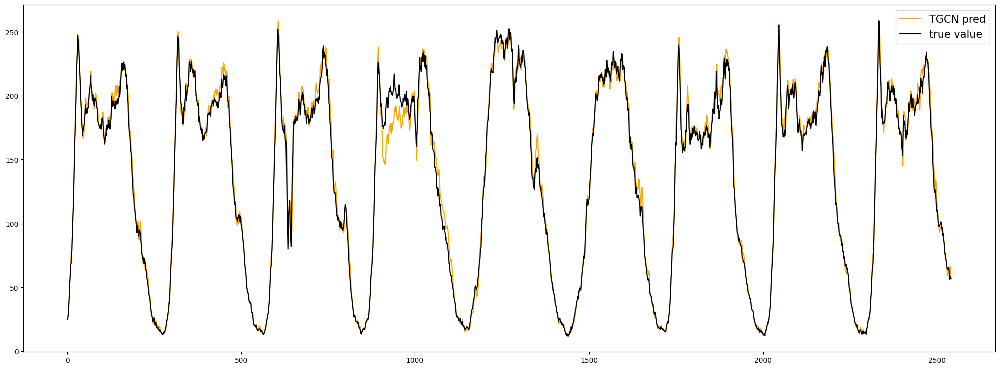

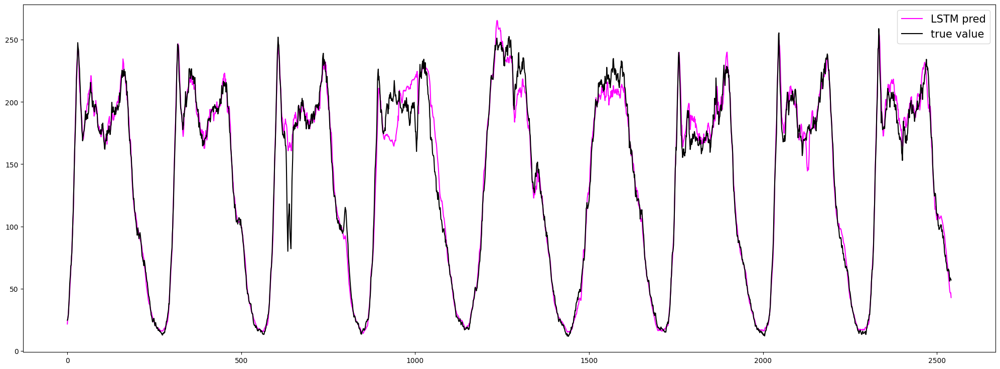

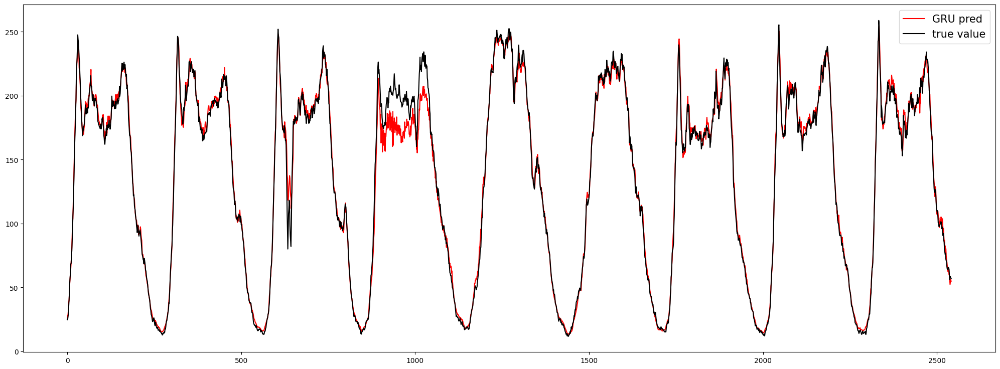

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 242,-,9.779502,13.288198,ERROR,31.468222,25.723304
LSTM Model captor 242,+,7.933441,11.324467,ERROR,19.282499,19.095405
GRU Model captor 242,+,4.712690,6.316831,ERROR,22.319782,22.488382


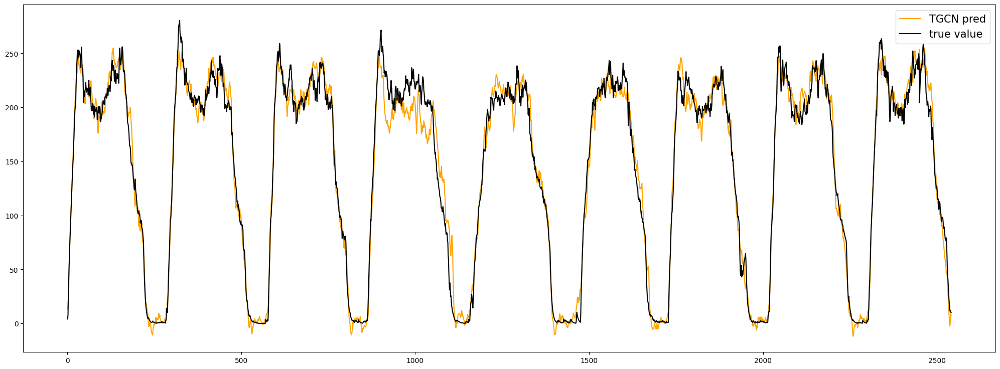

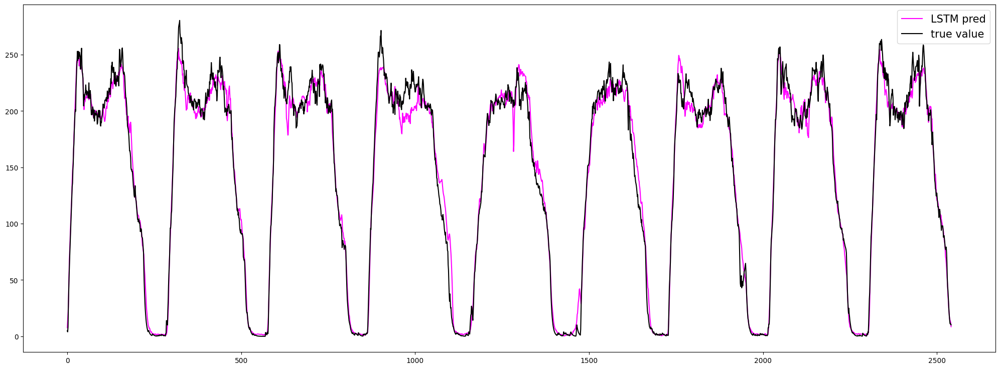

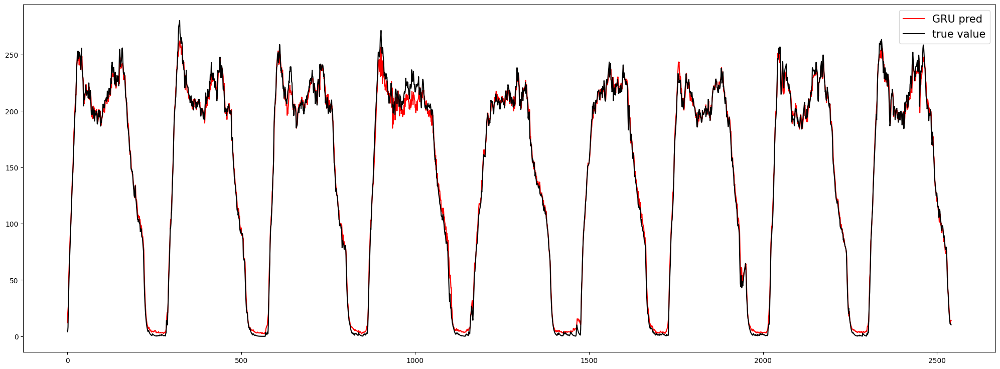

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 243,+,6.788770,9.405207,ERROR,4.553239,4.527711
LSTM Model captor 243,+,8.919774,16.526874,ERROR,5.395566,5.514221
GRU Model captor 243,-,5.871359,10.394636,ERROR,3.789059,3.744416


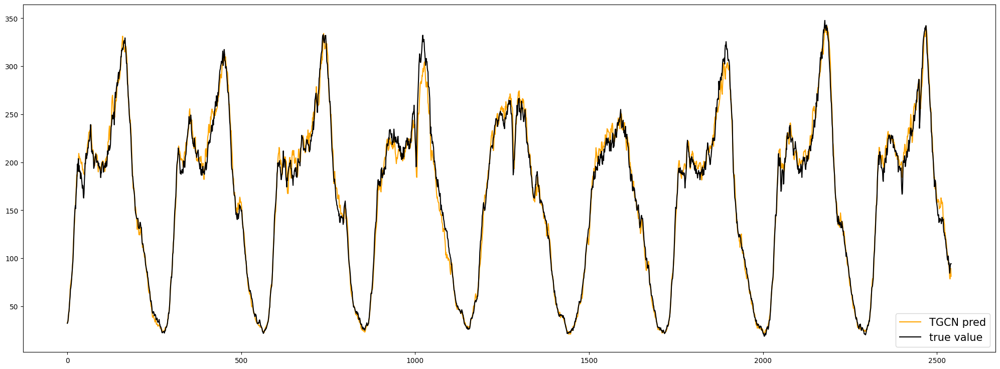

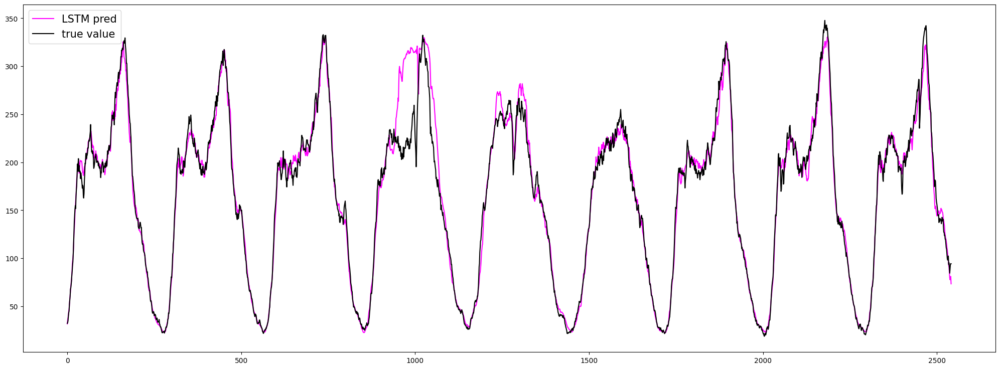

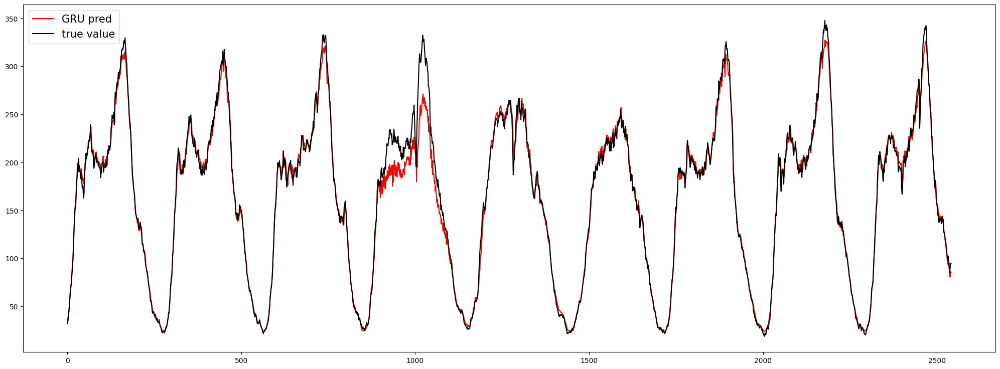

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 117,+,11.301371,15.303040,ERROR,5.851914,5.660515
LSTM Model captor 117,+,15.202599,28.149434,ERROR,5.963177,6.123041
GRU Model captor 117,+,12.527185,19.640334,ERROR,6.068328,6.144507


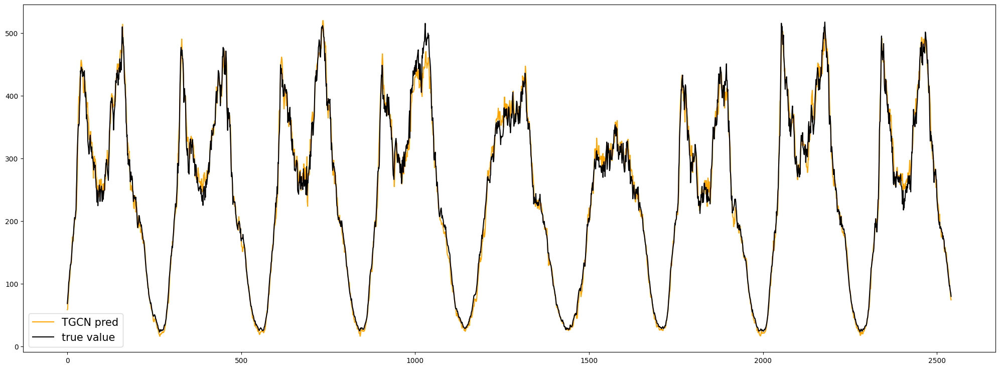

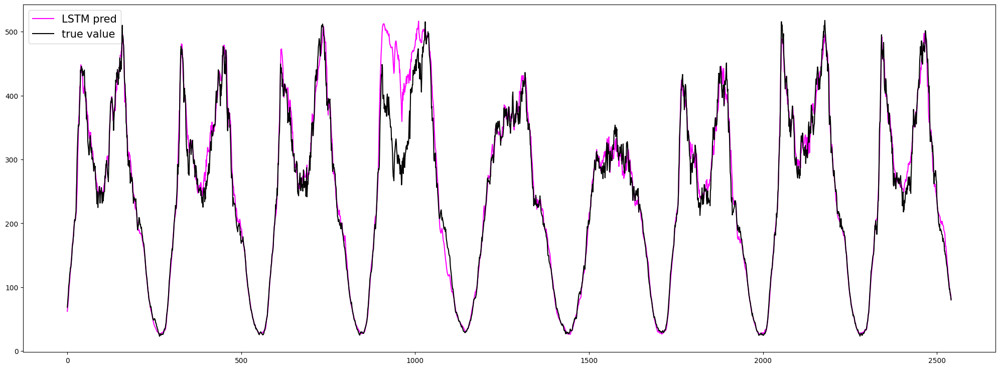

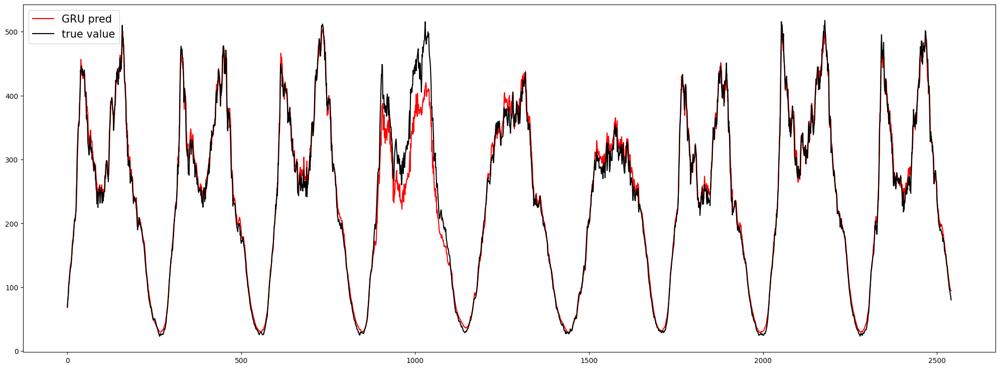

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 28,-,29.146626,54.809639,ERROR,13.368445,10.929085
LSTM Model captor 28,-,13.536063,21.718561,ERROR,5.963601,5.876416
GRU Model captor 28,+,9.702872,13.080532,ERROR,4.905100,5.053248


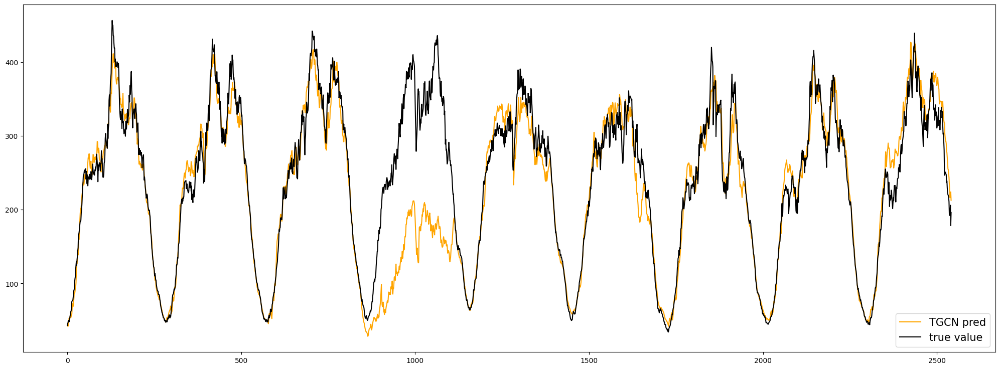

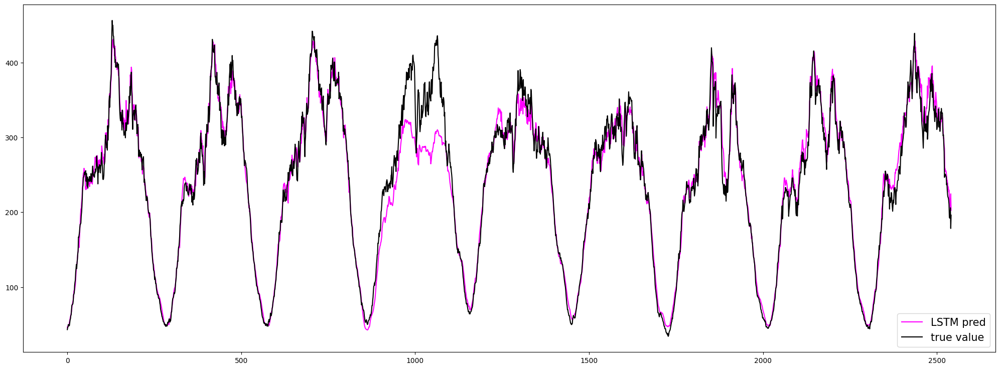

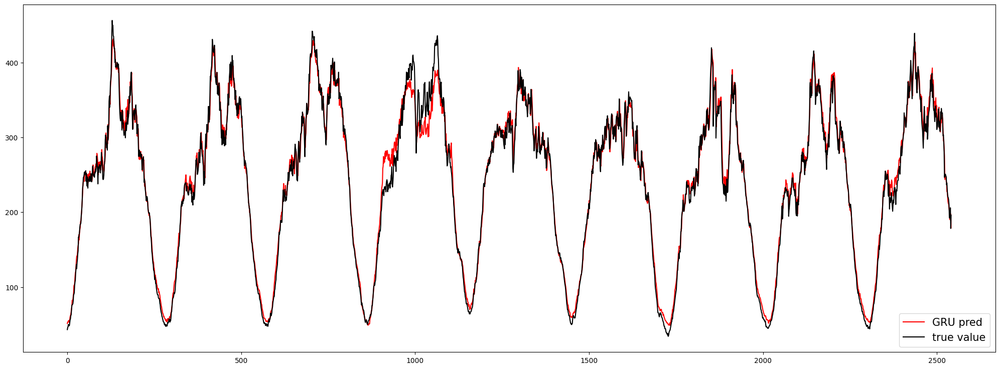

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 170,+,10.782825,14.675334,ERROR,5.720546,5.640389
LSTM Model captor 170,-,9.221338,15.299023,ERROR,4.678625,4.607080
GRU Model captor 170,-,6.717382,8.958464,ERROR,5.203221,5.508813


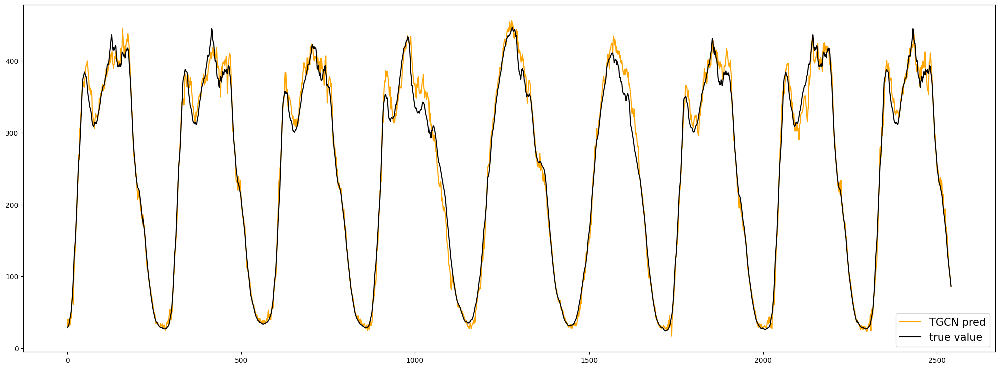

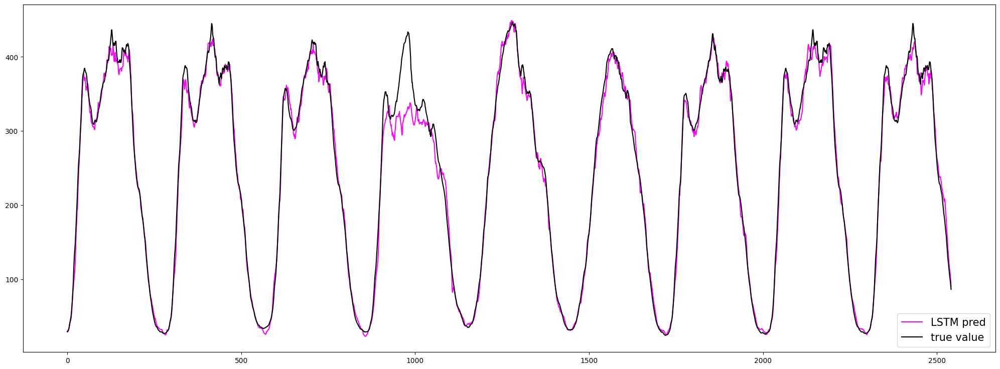

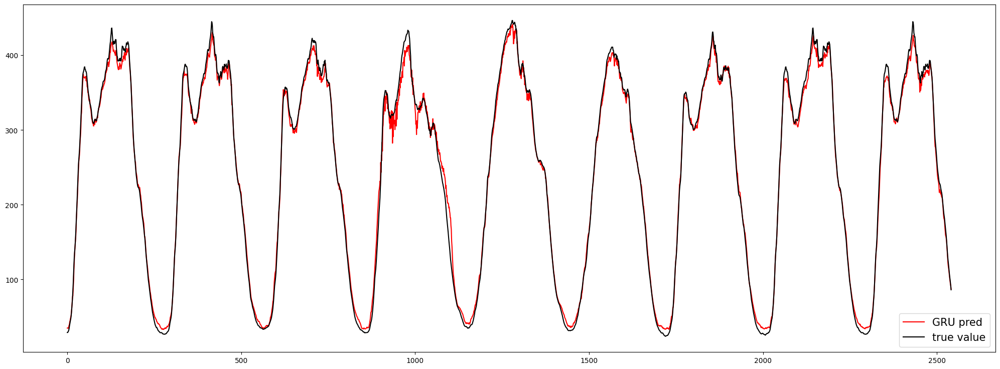

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 0,+,11.063275,15.614372,ERROR,4.328095,4.372352
LSTM Model captor 0,+,13.116940,17.978329,ERROR,6.004131,6.148175
GRU Model captor 0,+,7.992539,10.678419,ERROR,4.131777,4.248419


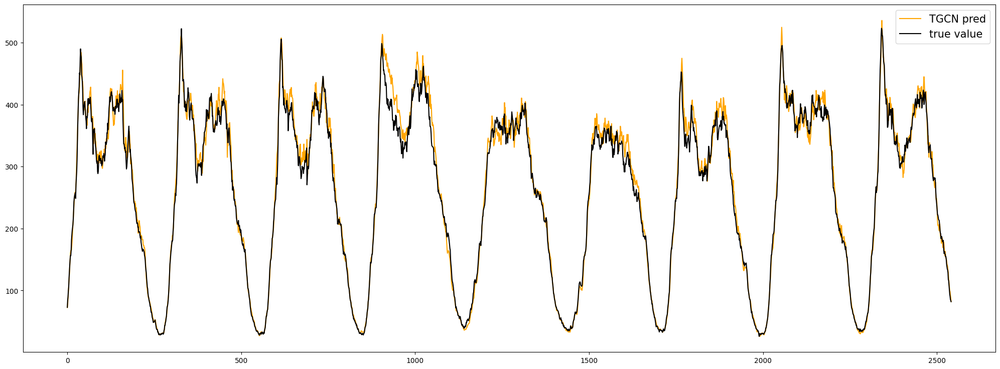

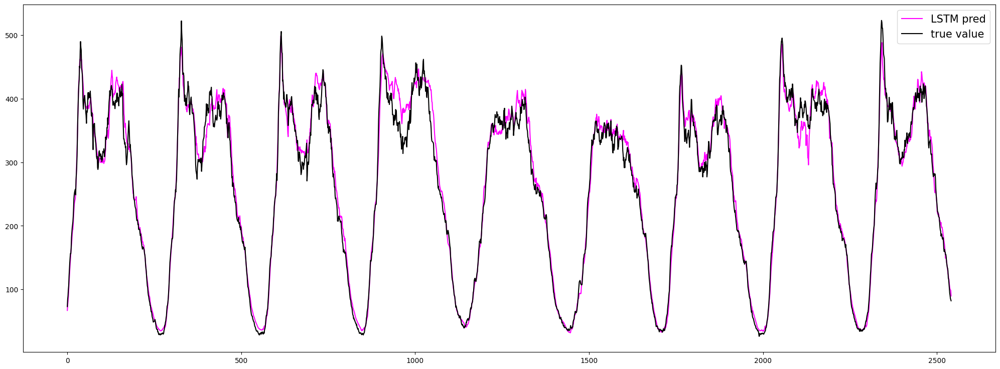

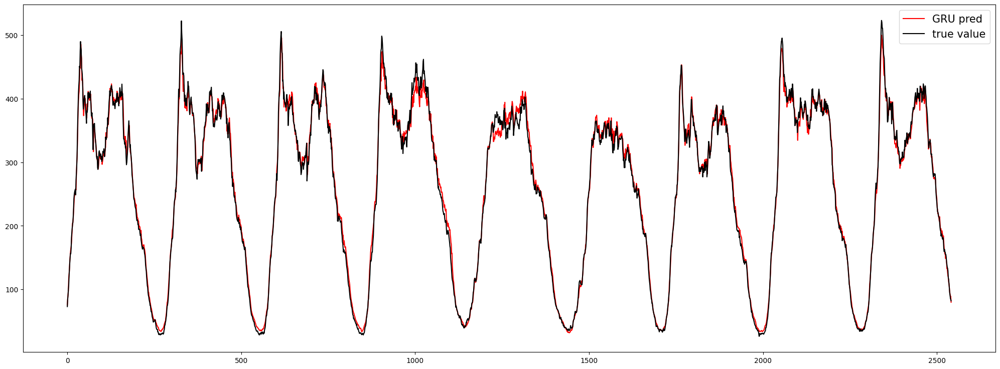

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 173,+,15.054401,20.910280,ERROR,5.142807,5.228398
LSTM Model captor 173,+,13.483514,18.658304,ERROR,4.648793,4.734813
GRU Model captor 173,+,9.384429,13.241010,ERROR,2.977942,3.015558


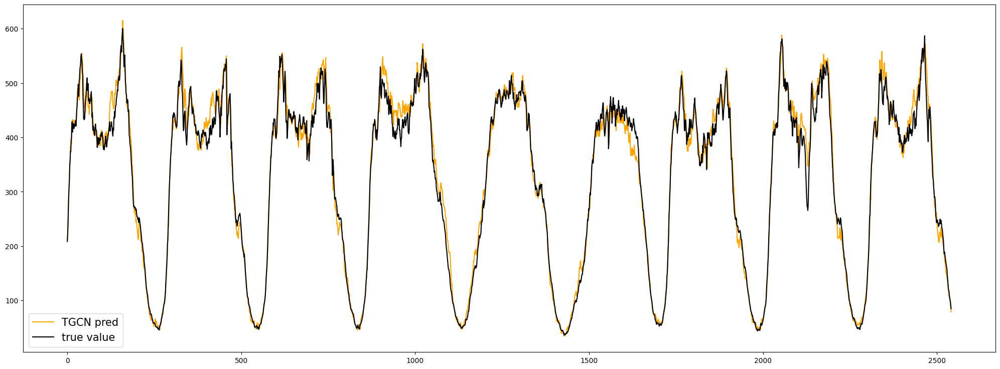

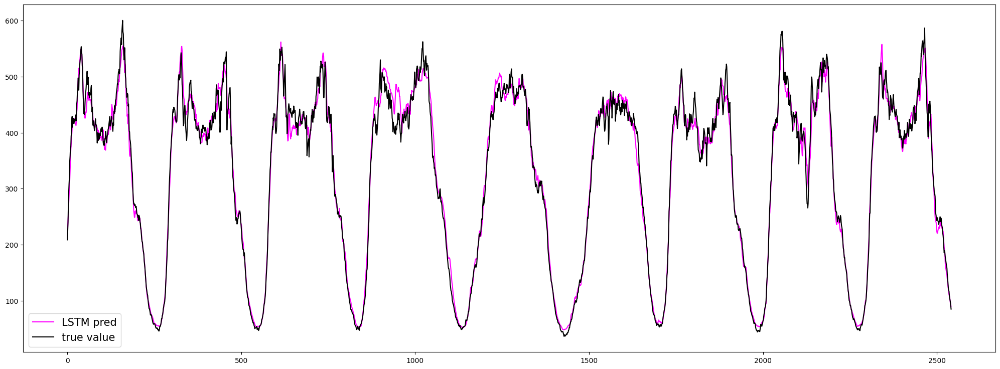

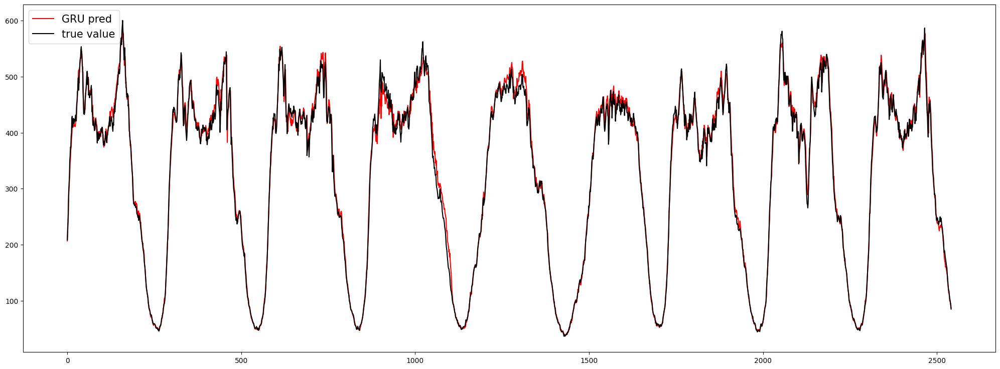

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 92,+,14.521548,19.726922,ERROR,4.740825,4.832583
LSTM Model captor 92,+,19.680795,24.547022,ERROR,10.103440,11.096721
GRU Model captor 92,+,13.510115,18.608783,ERROR,7.137482,7.720797


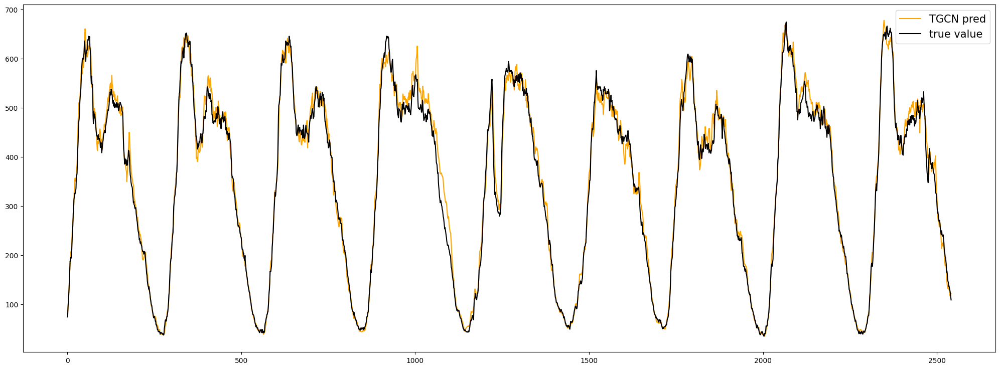

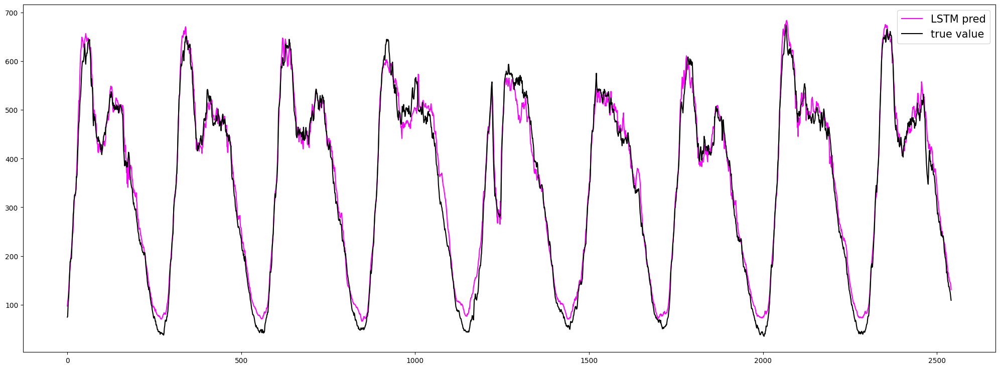

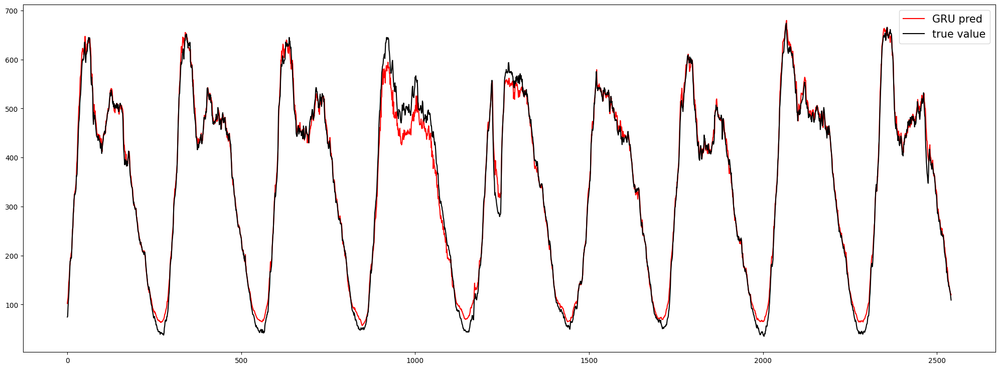

,Signe error,MAE,RMSE,MAPE,SMAPE,MAAPE
Captor,,,,,,
TGCN Model captor 57,+,52.399221,103.915962,ERROR,26.612642,22.451945
LSTM Model captor 57,+,48.311692,112.136254,ERROR,24.328634,20.246967
GRU Model captor 57,+,30.202507,63.545422,ERROR,22.798949,18.771600


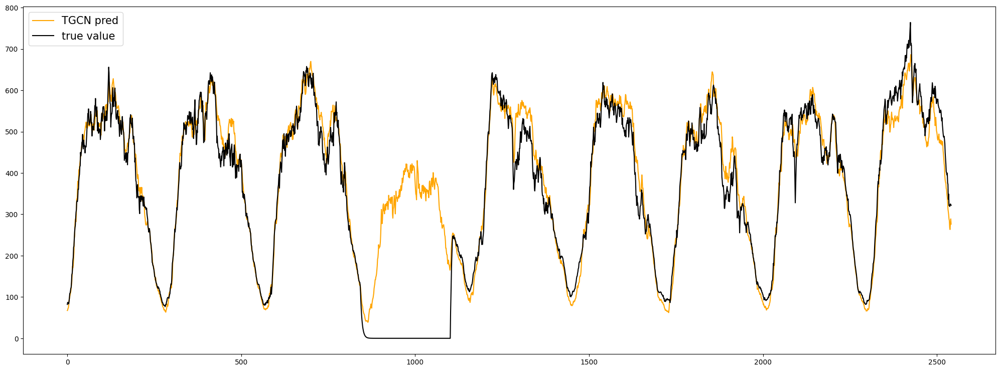

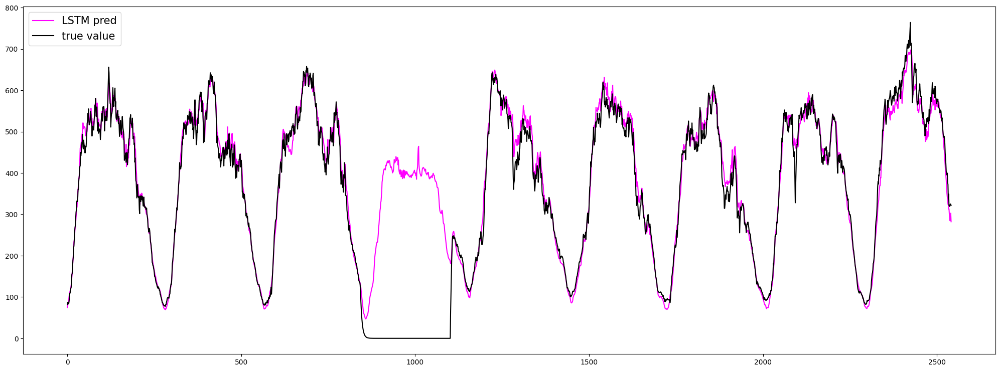

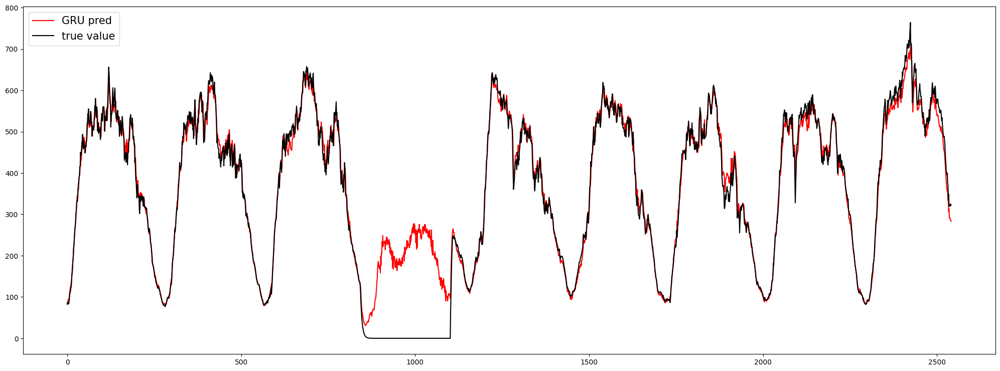

In [56]:
import matplotlib.pyplot as plt

dict_results_multivariate_model = { "TGCN": 0,
                    "LSTM": 0,
                    "GRU": 0
}

######################################################################
# TGCN
######################################################################
# load best model
model_TGCN.load_state_dict(torch.load(f"./{normalization}/nb_captor_{n_neighbors+1}/epoch_{num_epochs_TGCN}/TGCN_model.pkl".format(input)))

# Make predictions
predictions_TGCN, actuals_TGCN =  test_model(model_TGCN, test_loader_TGCN)


######################################################################
# LSTM
######################################################################
# load best model
models_multivariate_LSTM["model"].load_state_dict(torch.load(f"./{normalization}/nb_captor_{n_neighbors+1}/epoch_{num_epochs_LSTM_multivariate}/multivariate_LSTM_model.pkl".format(input)))
    
# Make predictions
predictions_LSTM, actuals_LSTM = test_model(models_multivariate_LSTM["model"], 
                                models_multivariate_GRU["test_loader"])


######################################################################
# GRU
######################################################################
# Load best model
models_multivariate_GRU["model"].load_state_dict(torch.load(f"./{normalization}/nb_captor_{n_neighbors+1}/epoch_{num_epochs_GRU_multivariate}/multivariate_GRU_model.pkl".format(input)))

# Make predictions
predictions_GRU, actuals_GRU = test_model(models_multivariate_GRU["model"], 
                                models_multivariate_GRU["test_loader"])

for i in range(n_neighbors+1):

######################################################################
# TGCN
######################################################################
    # Save result for each captor
    temp = result_prediction(predictions_TGCN[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], 
                            actuals_TGCN[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"])
    temp.append(f"TGCN Model captor {df_PeMS.columns[i]}")
    data = [temp]


######################################################################
# LSTM
######################################################################
    # Save result
    temp = result_prediction(predictions_LSTM[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], 
                            actuals_LSTM[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"])

    temp.append(f"LSTM Model captor {df_PeMS.columns[i]}")
    data.append(temp)


######################################################################
# GRU
######################################################################
    # Save results
    temp = result_prediction(predictions_GRU[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], 
                            actuals_GRU[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"])
    temp.append(f"GRU Model captor {df_PeMS.columns[i]}")
    data.append(temp)


######################################################################
# Dataframe
######################################################################

    df = pd.DataFrame(data, columns=['Signe error', 'MAE', 'RMSE', 'MAPE', 'SMAPE', 'MAAPE', "Captor"])

    # Définir le mois comme index du DataFrame
    df.set_index('Captor', inplace=True)

    pd.set_option('display.max_columns', None)
    pd.set_option('display.max_rows', None)
    pd.set_option('display.width', None)

    min_val = df['MAAPE'].min()
    max_val = df['MAAPE'].max()
    #df = df.style.apply(highlight_col, axis=0, min_val=min_val)
    df = df.style.apply(highlight_rows, axis=1, min_val=min_val, max_val=max_val)
    dict_results_multivariate_model
    display(df)


######################################################################
# Plots
######################################################################

    plt.figure(figsize=(25, 9))
    plt.plot(predictions_TGCN[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], color="orange", label="TGCN pred")
    plt.plot(actuals_LSTM[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], color="black", label="true value")
    plt.legend(fontsize=15)
    plt.show()
    
    plt.figure(figsize=(25, 9))
    plt.plot(predictions_LSTM[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], color="magenta", label="LSTM pred")
    plt.plot(actuals_LSTM[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], color="black", label="true value")
    plt.legend(fontsize=15)
    plt.show()
    
    plt.figure(figsize=(25, 9))
    plt.plot(predictions_GRU[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], color="red", label="GRU pred" )
    plt.plot(actuals_LSTM[:, i] * meanstd_dict[df_PeMS.columns[i]]["std"] + meanstd_dict[df_PeMS.columns[i]]["mean"], color="black", label="true value")
    plt.legend(fontsize=15)
    plt.show()
